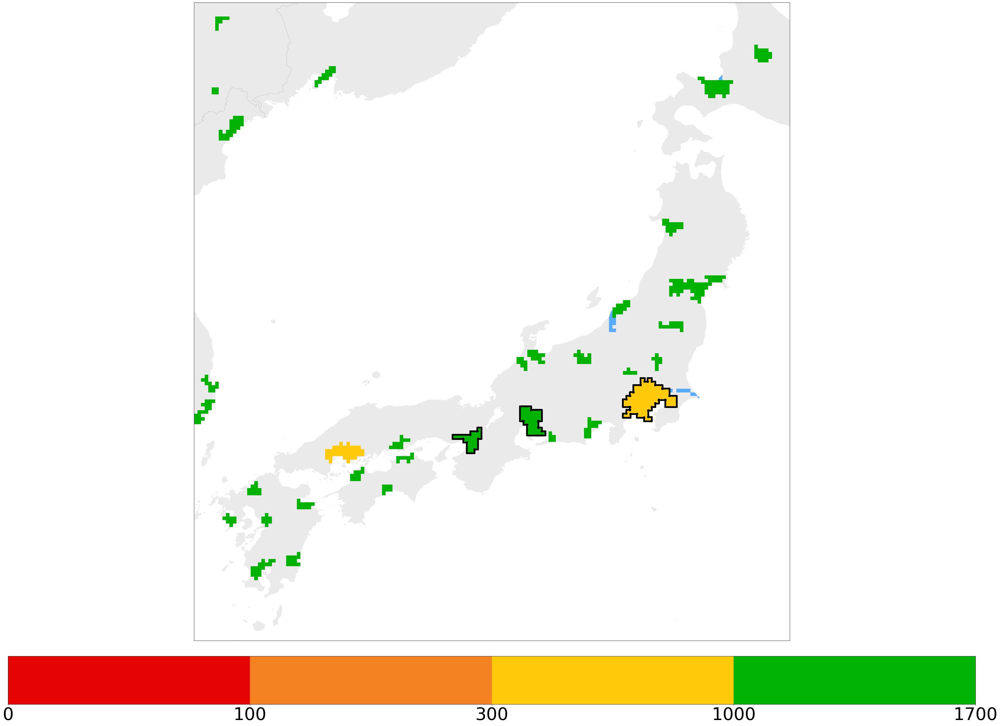

In [3]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import numpy as np
import os
import matplotlib.colors as mcolors

def geography(left, right, bottom, top):
    #
    resolution = 12
    #
    upperindex = (90-top)*resolution
    lowerindex = (90-bottom)*resolution
    leftindex = (180+left)*resolution
    rightindex = (180+right)*resolution
    #
    rgnshape = (lowerindex-upperindex, rightindex-leftindex)
    #
    img_extent = (left, right, bottom, top)
    
    return upperindex, lowerindex, leftindex, rightindex, rgnshape, img_extent

def draw_mask_sotowaku_outer(extent, mask_cropped, ax=None, sotowaku_color='#dc143c', linewidth=5, padding=0.1, pop_thres=5e6):
    """
    zorder = 0: デフォルトの最背面(gridをzorder=0に設定)
    zorder = 1: 赤色の外枠(citymask)
    
    extent: (x_left, x_right, y_bottom, y_top)
    mask_cropped: マスクされた都市域の2D配列
    ax: プロットする軸
    sotowaku_color: 枠線の色
    linewidth: 枠線の太さ
    padding: 枠線を外側にシフトさせる量（度単位）
    """
    mask_cropped = np.ma.filled(mask_cropped, 0)

    # delta
    delta = 360/4320
    x_left = extent[0]
    y_top = extent[3]
    
    # outer
    upper_indices = []
    lower_indices = []
    left_indices = []
    right_indices = []
    rows, cols = mask_cropped.shape
    for i in range(rows-1):
        for j in range(cols-1):
            if mask_cropped[i, j] > pop_thres and mask_cropped[i, j] != 0:
                if i > 0 and mask_cropped[i-1, j] == 0:
                    upper_indices.append((i, j))
                if i < rows-1 and mask_cropped[i+1, j] == 0:
                    lower_indices.append((i, j))
                if j > 0 and mask_cropped[i, j-1] == 0:
                    left_indices.append((i, j))
                if j < cols-1 and mask_cropped[i, j+1] == 0:
                    right_indices.append((i, j))

    # extent
    projection = ccrs.PlateCarree()

    # city mask
    for up in upper_indices:
        x_index = x_left + delta*(up[1])
        y_index = y_top - delta*(up[0]) + padding * delta
        ax.plot([x_index, x_index+delta], [y_index, y_index], color=sotowaku_color, transform=projection, linewidth=linewidth, zorder=1) # top
    for lo in lower_indices:
        x_index = x_left + delta*(lo[1])
        y_index = y_top - delta*(lo[0]+1) - padding * delta
        ax.plot([x_index, x_index+delta], [y_index, y_index], color=sotowaku_color, transform=projection, linewidth=linewidth, zorder=1) # bottom
    for le in left_indices:
        x_index = x_left + delta*(le[1]) - padding * delta
        y_index = y_top - delta*(le[0]+1)
        ax.plot([x_index, x_index], [y_index, y_index+delta], color=sotowaku_color, transform=projection, linewidth=linewidth, zorder=1) # left
    for ri in right_indices:
        x_index = x_left + delta*(ri[1]+1) + padding * delta
        y_index = y_top - delta*(ri[0]+1)
        ax.plot([x_index, x_index], [y_index, y_index+delta], color=sotowaku_color, transform=projection, linewidth=linewidth, zorder=1) # right

    return ax

def main_plot(left, right, bottom, top, linewidth=5, padding=0.1):
    h08dir = '/mnt/c/Users/tsimk/Downloads/dotfiles/h08'
    upperindex, lowerindex, leftindex, rightindex, rgnshape, img_extent = geography(left, right, bottom, top)
    
    # wsi/pre/population_m3year.ipynb
    population_path = f'{h08dir}/wsi/dat/population/population_threshold_world.npy'
    population = np.load(population_path)
    population_cropped = population[upperindex:lowerindex, leftindex:rightindex]
    
    # discharge
    threshold = 5*1e6*2500
    riv_path = f'{h08dir}/wsi/dat/riv_out_/W5E5LR__00000000.gl5'
    rivout = np.fromfile(riv_path, dtype='float32').reshape(2160, 4320)
    rivout_cropped = rivout[upperindex:lowerindex, leftindex:rightindex] * 60 * 60 * 24 * 365 / 1000
    rivout_masked = np.ma.masked_where(rivout_cropped==0, rivout_cropped)
    rivout_thres = np.ma.masked_where(rivout_masked<threshold, rivout_masked)
    
    # wsi/pre/MPCY_citylonlat_citygrid.ipynb
    grid_path = f'{h08dir}/wsi/dat/cmy/world_citygrid_100km.npy'
    citygrid = np.load(grid_path)
    citygrid_masked = np.ma.masked_where(citygrid==0, citygrid)
    
    region = citygrid_masked[upperindex:lowerindex, leftindex:rightindex]
    region_masked = np.ma.masked_where(region==0, region)
    
    bounds = [0, 100, 300, 1000, 1700]
    #cmap = mcolors.ListedColormap(['#e40404', '#f58220', '#feca0a', '#89989c'])
    #cmap = mcolors.ListedColormap(['#e40404', '#f58220', '#feca0a', '#f0fff0'])
    cmap = mcolors.ListedColormap(['#e40404', '#f58220', '#feca0a', '#00b200'])
    norm = mcolors.BoundaryNorm(bounds, cmap.N)
    
    plt.rcParams["font.size"] = 50
    projection = ccrs.PlateCarree()
    fig, ax = plt.subplots(figsize=(50,40), subplot_kw={'projection': projection})

    #river_cmap = mcolors.ListedColormap(['#60c9f8'])
    #river_cmap = mcolors.ListedColormap(['#3eb1c8'])
    river_cmap = mcolors.ListedColormap(['#57acff'])
    imr = ax.imshow(rivout_thres, 
                    extent=img_extent,
                    cmap=river_cmap,
                    transform=projection,
                    zorder=-2
                   )
    
    imd = ax.imshow(region_masked, 
                  cmap= cmap,
                  norm = norm,
                  extent=img_extent,
                  transform=projection, 
                 )
    
    ax.add_feature(cfeature.LAND, edgecolor='none', facecolor='#eaeaea', zorder=-3)
    ax.add_feature(cfeature.OCEAN, edgecolor='none', facecolor='#ffffff')
    ax.add_feature(cfeature.LAKES, edgecolor='none', facecolor='#ffffff', zorder=-1)
    ax.add_feature(cfeature.COASTLINE, linewidth=0.1,edgecolor='#d0cfd4')
    ax.add_feature(cfeature.BORDERS, linestyle='-', linewidth=1.5, edgecolor='#d0cfd4', zorder=-3)
    ax.gridlines(visible=False)
    cbar = fig.colorbar(imd, ax=ax, orientation='horizontal', pad=0.02)
    draw_mask_sotowaku_outer(img_extent, population_cropped, ax=ax, sotowaku_color='black', linewidth=linewidth, padding=padding, pop_thres=5e6)
    plt.show()

left, right, bottom, top = 129, 143, 30, 45
main_plot(left, right, bottom, top)

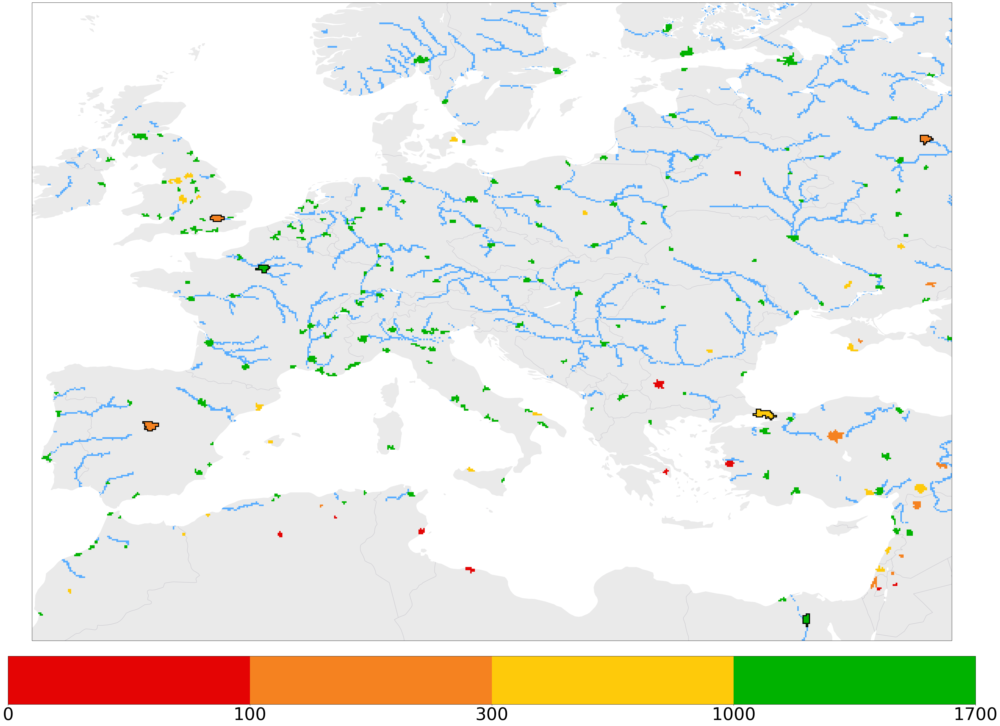

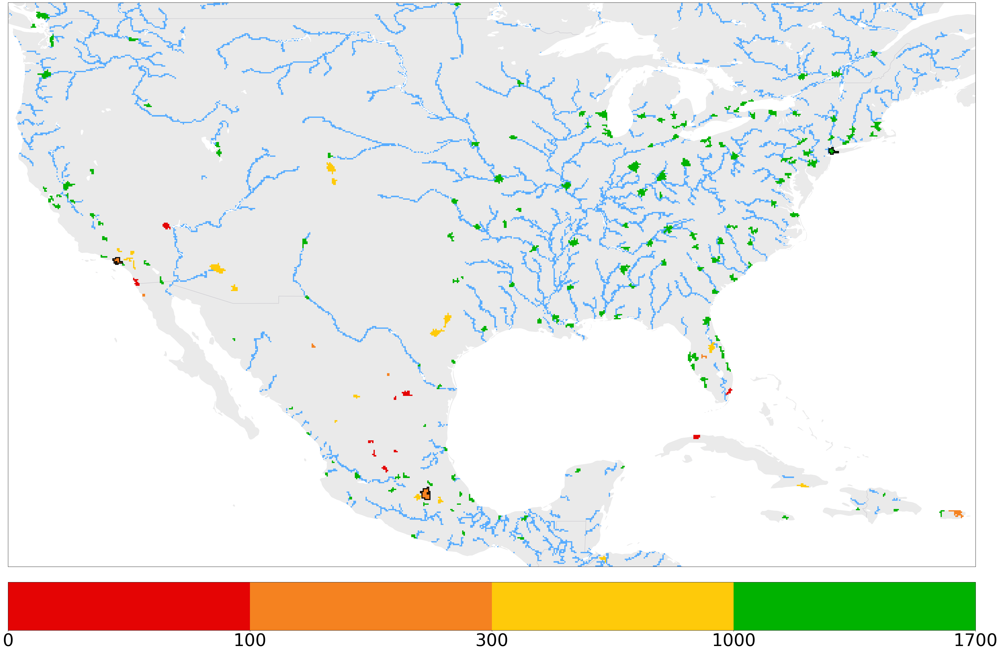

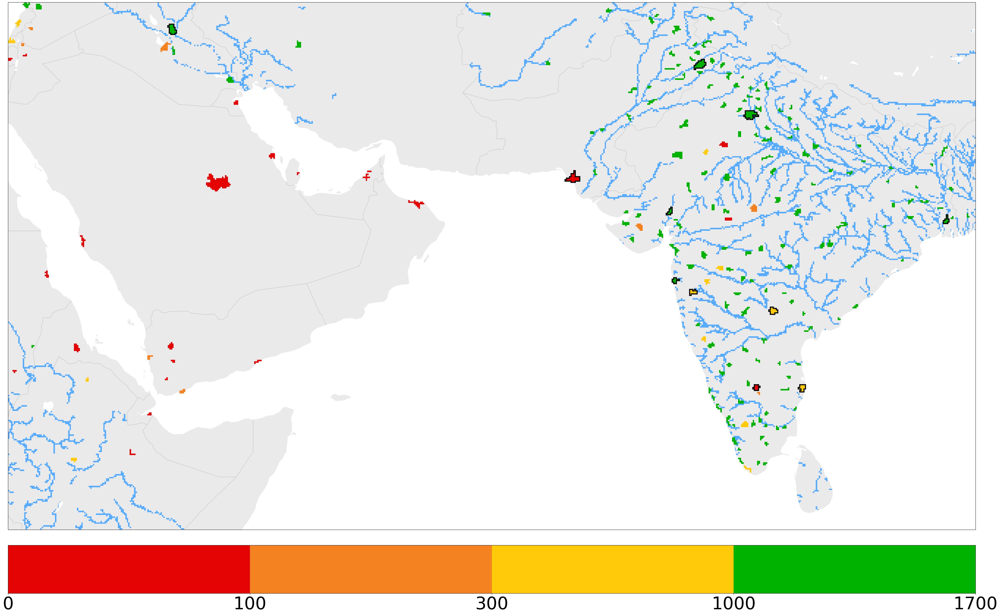

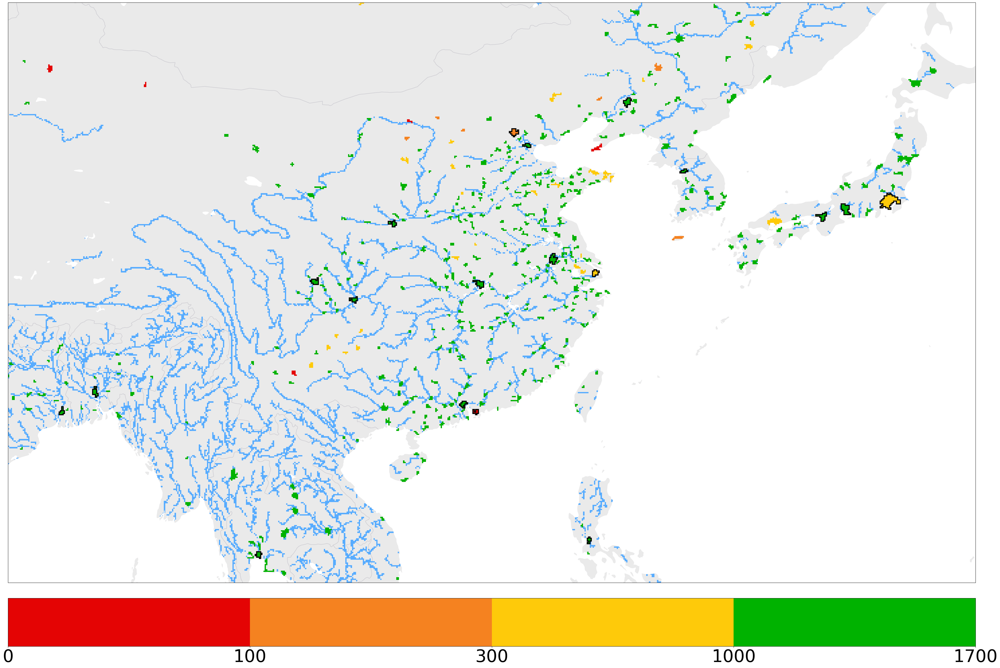

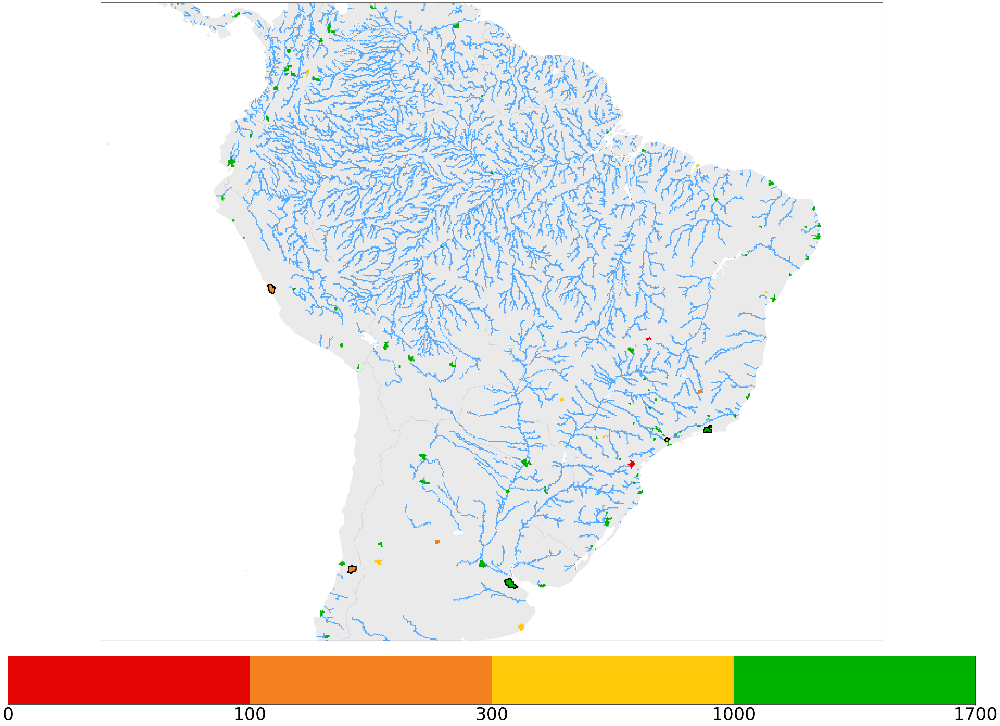

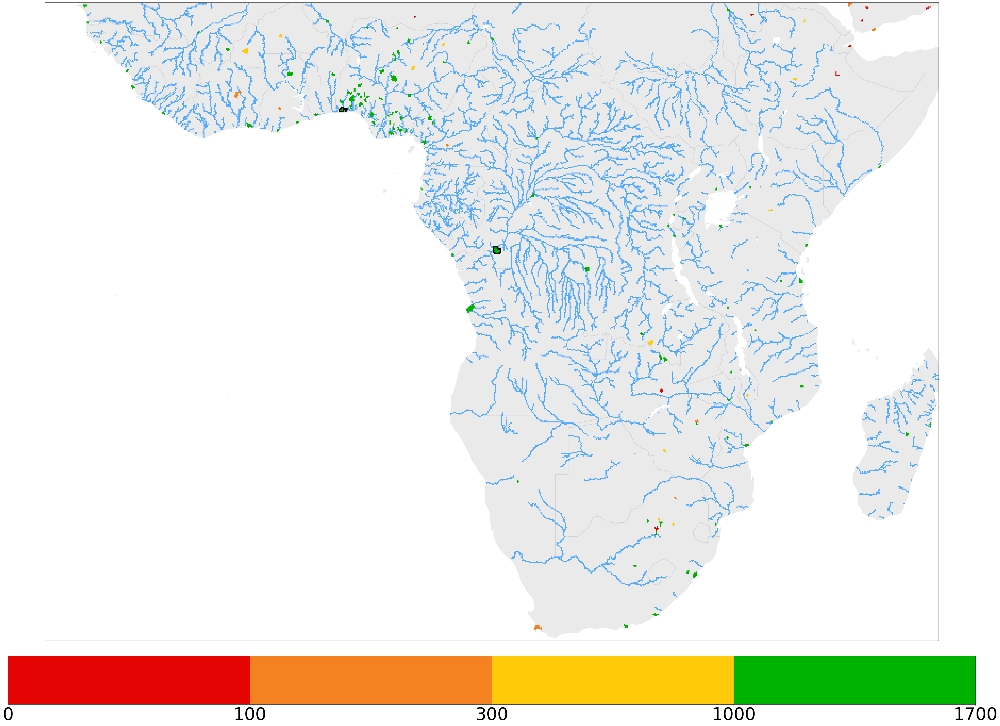

In [4]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import numpy as np
import os
import matplotlib.colors as mcolors

def geography(left, right, bottom, top):
    #
    resolution = 12
    #
    upperindex = (90-top)*resolution
    lowerindex = (90-bottom)*resolution
    leftindex = (180+left)*resolution
    rightindex = (180+right)*resolution
    #
    rgnshape = (lowerindex-upperindex, rightindex-leftindex)
    #
    img_extent = (left, right, bottom, top)
    
    return upperindex, lowerindex, leftindex, rightindex, rgnshape, img_extent

def draw_mask_sotowaku_outer(extent, mask_cropped, ax=None, sotowaku_color='#dc143c', linewidth=5, padding=0.1, pop_thres=5e6):
    """
    zorder = 0: デフォルトの最背面(gridをzorder=0に設定)
    zorder = 1: 赤色の外枠(citymask)
    
    extent: (x_left, x_right, y_bottom, y_top)
    mask_cropped: マスクされた都市域の2D配列
    ax: プロットする軸
    sotowaku_color: 枠線の色
    linewidth: 枠線の太さ
    padding: 枠線を外側にシフトさせる量（度単位）
    """
    mask_cropped = np.ma.filled(mask_cropped, 0)

    # delta
    delta = 360/4320
    x_left = extent[0]
    y_top = extent[3]
    
    # outer
    upper_indices = []
    lower_indices = []
    left_indices = []
    right_indices = []
    rows, cols = mask_cropped.shape
    for i in range(rows-1):
        for j in range(cols-1):
            if mask_cropped[i, j] > pop_thres and mask_cropped[i, j] != 0:
                if i > 0 and mask_cropped[i-1, j] == 0:
                    upper_indices.append((i, j))
                if i < rows-1 and mask_cropped[i+1, j] == 0:
                    lower_indices.append((i, j))
                if j > 0 and mask_cropped[i, j-1] == 0:
                    left_indices.append((i, j))
                if j < cols-1 and mask_cropped[i, j+1] == 0:
                    right_indices.append((i, j))

    # extent
    projection = ccrs.PlateCarree()

    # city mask
    for up in upper_indices:
        x_index = x_left + delta*(up[1])
        y_index = y_top - delta*(up[0]) + padding * delta
        ax.plot([x_index, x_index+delta], [y_index, y_index], color=sotowaku_color, transform=projection, linewidth=linewidth, zorder=1) # top
    for lo in lower_indices:
        x_index = x_left + delta*(lo[1])
        y_index = y_top - delta*(lo[0]+1) - padding * delta
        ax.plot([x_index, x_index+delta], [y_index, y_index], color=sotowaku_color, transform=projection, linewidth=linewidth, zorder=1) # bottom
    for le in left_indices:
        x_index = x_left + delta*(le[1]) - padding * delta
        y_index = y_top - delta*(le[0]+1)
        ax.plot([x_index, x_index], [y_index, y_index+delta], color=sotowaku_color, transform=projection, linewidth=linewidth, zorder=1) # left
    for ri in right_indices:
        x_index = x_left + delta*(ri[1]+1) + padding * delta
        y_index = y_top - delta*(ri[0]+1)
        ax.plot([x_index, x_index], [y_index, y_index+delta], color=sotowaku_color, transform=projection, linewidth=linewidth, zorder=1) # right

    return ax

def toy_plot(left, right, bottom, top, linewidth=5, padding=0.1):
    h08dir = '/mnt/c/Users/tsimk/Downloads/dotfiles/h08'
    upperindex, lowerindex, leftindex, rightindex, rgnshape, img_extent = geography(left, right, bottom, top)
    
    # wsi/pre/population_m3year.ipynb
    population_path = f'{h08dir}/wsi/dat/population/population_threshold_world.npy'
    population = np.load(population_path)
    population_cropped = population[upperindex:lowerindex, leftindex:rightindex]
    
    # discharge
    threshold = 1*1e6*2500
    riv_path = f'{h08dir}/wsi/dat/riv_out_/W5E5LR__00000000.gl5'
    rivout = np.fromfile(riv_path, dtype='float32').reshape(2160, 4320)
    rivout_cropped = rivout[upperindex:lowerindex, leftindex:rightindex] * 60 * 60 * 24 * 365 / 1000
    rivout_masked = np.ma.masked_where(rivout_cropped==0, rivout_cropped)
    rivout_thres = np.ma.masked_where(rivout_masked<threshold, rivout_masked)
    
    # wsi/pre/MPCY_citylonlat_citygrid.ipynb
    grid_path = f'{h08dir}/wsi/dat/cmy/world_citygrid_100km.npy'
    citygrid = np.load(grid_path)
    citygrid_masked = np.ma.masked_where(citygrid==0, citygrid)
    region = citygrid_masked[upperindex:lowerindex, leftindex:rightindex]
    region_masked = np.ma.masked_where(region==0, region)
    
    bounds = [0, 100, 300, 1000, 1700]
    #cmap = mcolors.ListedColormap(['#e40404', '#f58220', '#feca0a', '#89989c'])
    #cmap = mcolors.ListedColormap(['#e40404', '#f58220', '#feca0a', '#f0fff0'])
    cmap = mcolors.ListedColormap(['#e40404', '#f58220', '#feca0a', '#00b200'])
    norm = mcolors.BoundaryNorm(bounds, cmap.N)
    
    plt.rcParams["font.size"] = 50
    projection = ccrs.PlateCarree()
    fig, ax = plt.subplots(figsize=(50,40), subplot_kw={'projection': projection})

    #river_cmap = mcolors.ListedColormap(['#60c9f8'])
    #river_cmap = mcolors.ListedColormap(['#3eb1c8'])
    river_cmap = mcolors.ListedColormap(['#57acff'])
    imr = ax.imshow(rivout_thres, 
                    extent=img_extent,
                    cmap=river_cmap,
                    transform=projection,
                    zorder=-2
                   )
    
    imd = ax.imshow(region_masked, 
                  cmap= cmap,
                  norm = norm,
                  extent=img_extent,
                  transform=projection, 
                 )
    
    ax.add_feature(cfeature.LAND, edgecolor='none', facecolor='#eaeaea', zorder=-3)
    ax.add_feature(cfeature.OCEAN, edgecolor='none', facecolor='#ffffff')
    ax.add_feature(cfeature.LAKES, edgecolor='none', facecolor='#ffffff', zorder=-1)
    ax.add_feature(cfeature.COASTLINE, linewidth=0.1,edgecolor='#d0cfd4')
    ax.add_feature(cfeature.BORDERS, linestyle='-', linewidth=1.5, edgecolor='#d0cfd4', zorder=-3)
    ax.gridlines(visible=False)
    cbar = fig.colorbar(imd, ax=ax, orientation='horizontal', pad=0.02)
    draw_mask_sotowaku_outer(img_extent, population_cropped, ax=ax, sotowaku_color='black', linewidth=linewidth, padding=padding, pop_thres=5e6)
    plt.show()

linewidth = 3
padding = 0.0
toy_plot(-10, 39, 29, 63, linewidth=linewidth, padding=padding)
toy_plot(-125, -65, 15, 50, linewidth=linewidth, padding=padding)
toy_plot(35 ,90, 5, 35, linewidth=linewidth, padding=padding)
toy_plot(85, 145, 12, 48, linewidth=linewidth, padding=padding)
toy_plot(-90, -30, -39, 10, linewidth=linewidth, padding=padding)
toy_plot(-20, 50, -35, 15, linewidth=linewidth, padding=padding)

In [ ]:
toy_plot(35 ,90, 5, 35, linewidth=linewidth, padding=padding)

In [43]:
# Crouch 2021 AQUA
# minimum  92 L/capita/day = 33.58 m3/capita/year
# maximum 314 L/capita/day = 114.61 m3/capita/year

# AQUASTAT
# population total of gpwv4.11 = 6,929,592,300
# 4300km3 / 6.929 billion      = 620.58 m3/capita/yeaer    = 1700 L/capita/year
# municipal(11%)               = 68.260 m3/capita/year     = 187.01 L/capita/year
# industry (19%)               = 117.91 m3/capita/year     = 323.04 L/capita/year
# agriculture (70%)            = 434.41 m3/capita/year     = 1190.1 L/capita/year

# Falkenmark 1989
# 1000 m3/capita/year
# municipal (11%)   = 110 m3/capita/yaer = 300 L/capita/day
# industry  (19%)   = 190 m3/capita/year = 518 L/capita/day
# agriculture (70%) = 700 m3/capita/year = 1911 L/capita/day

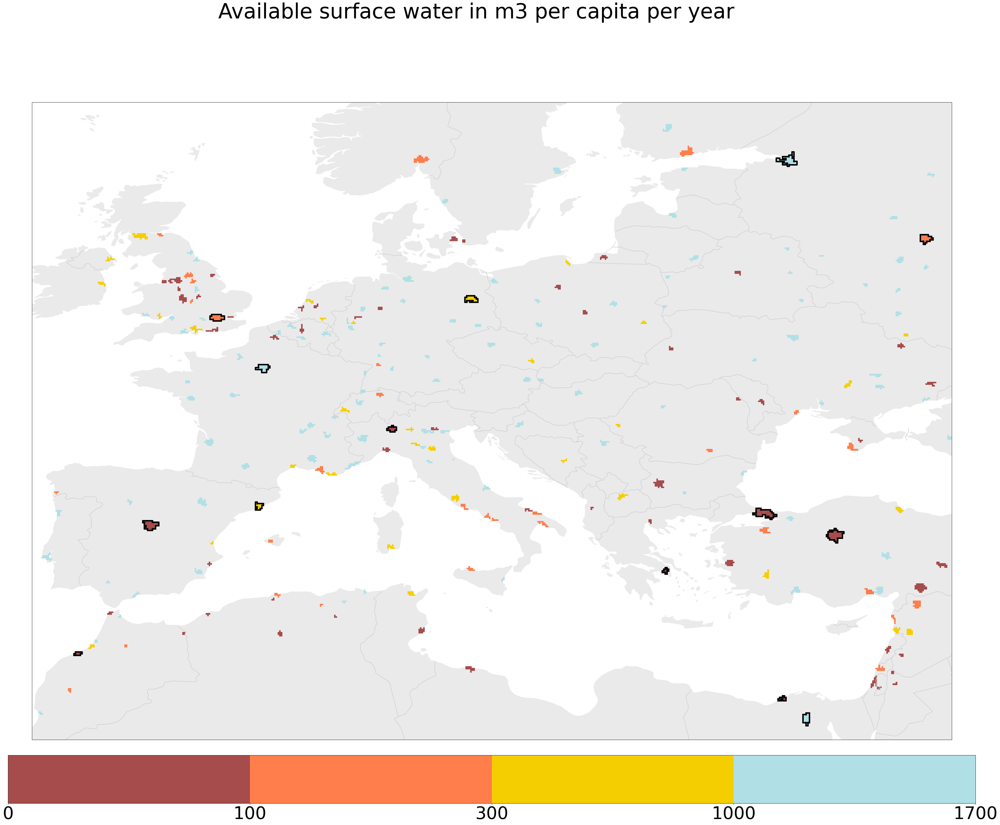

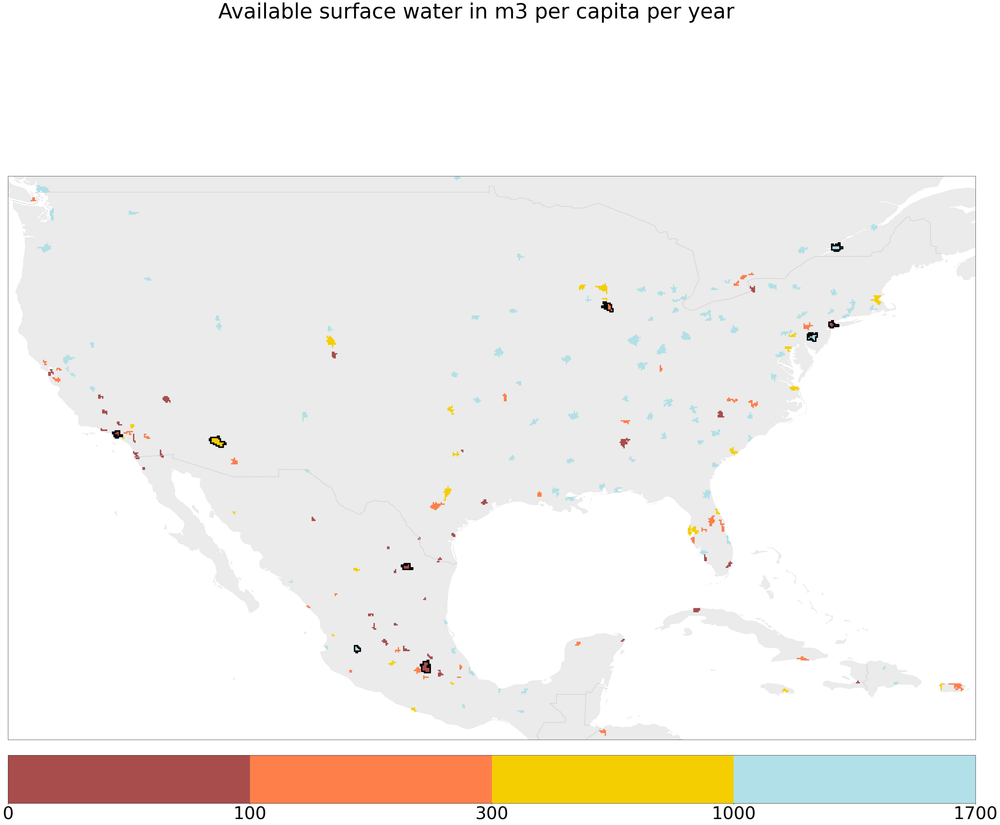

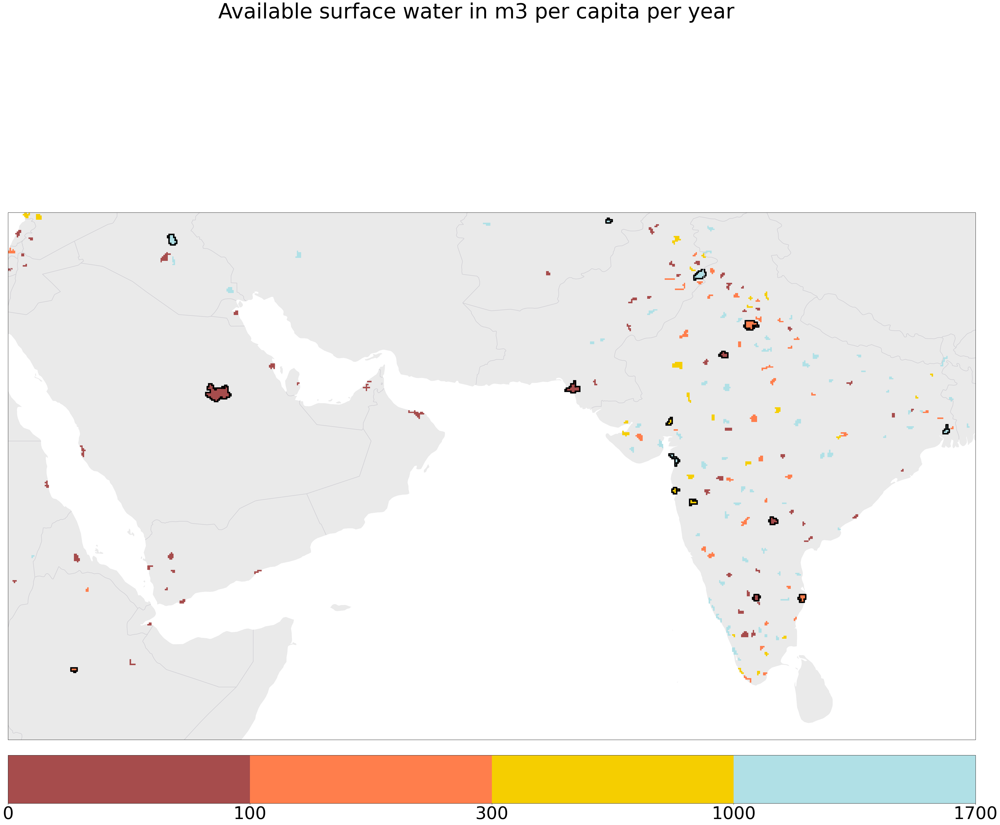

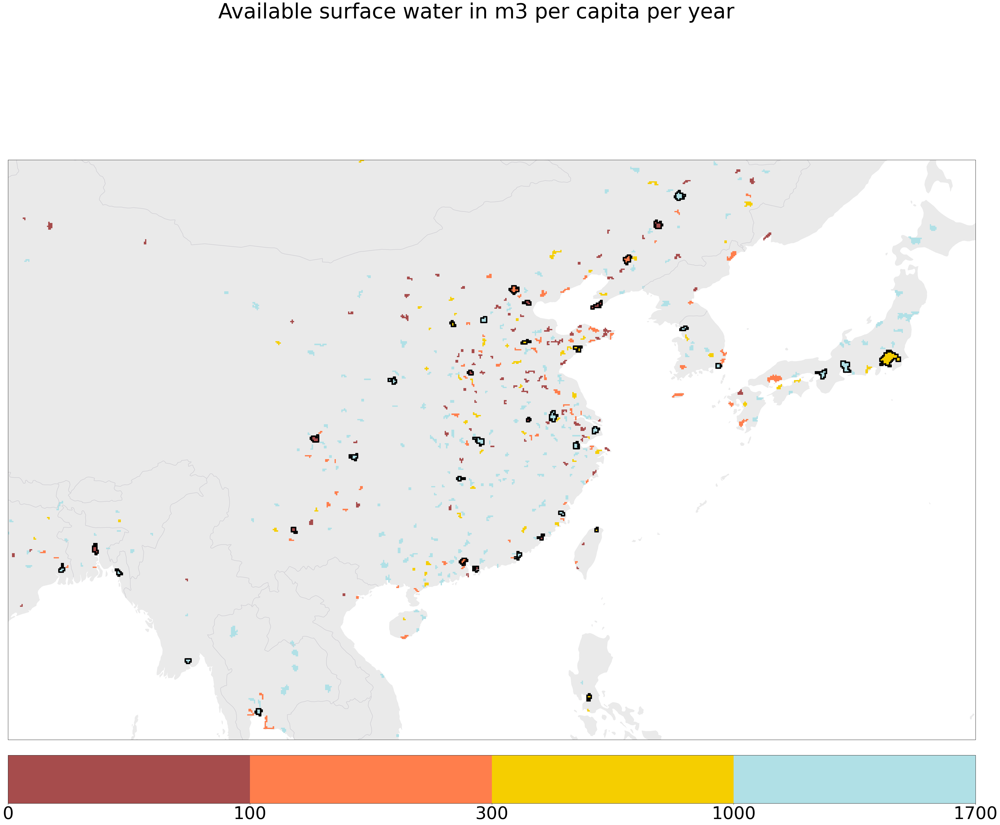

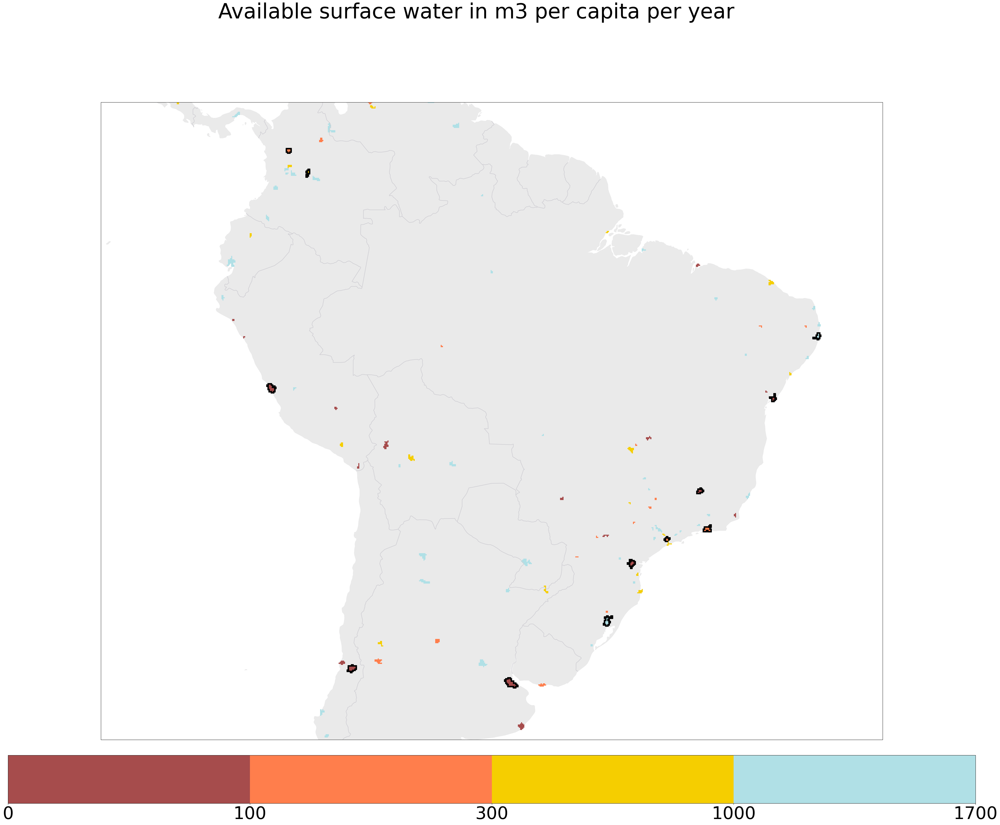

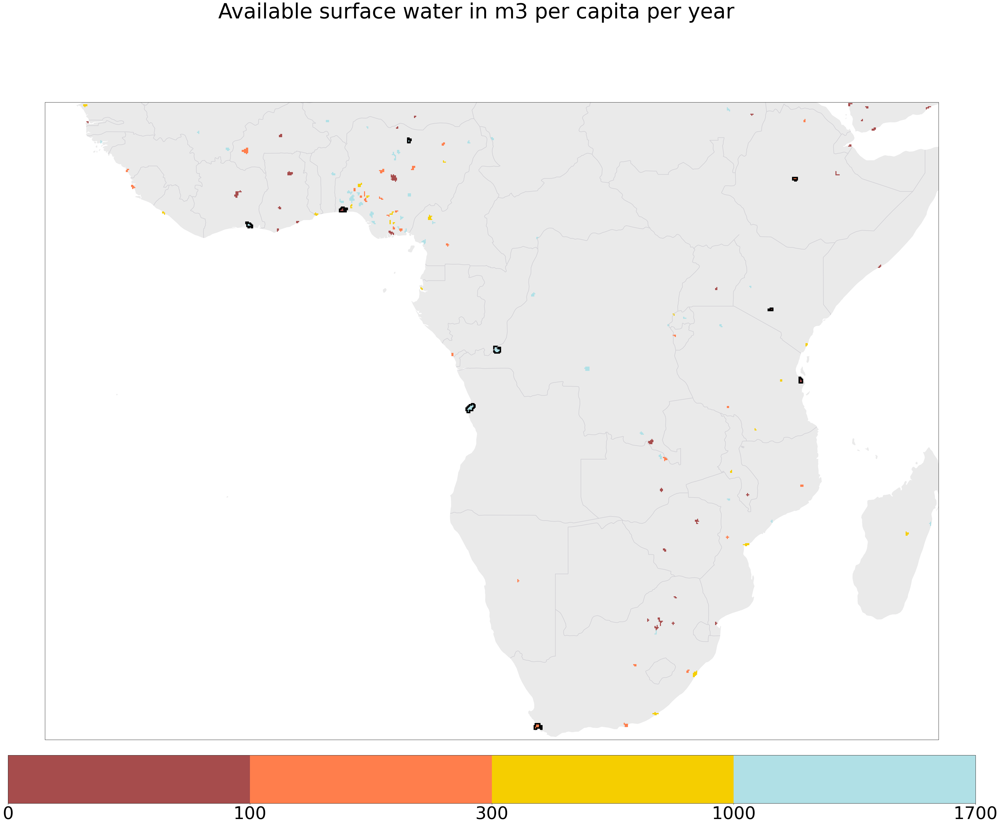

In [46]:
linewidth = 4
padding = 0.1
main_plot(-10, 39, 29, 63, linewidth=linewidth, padding=padding)
main_plot(-125, -65, 15, 50, linewidth=linewidth, padding=padding)
main_plot(35 ,90, 5, 35, linewidth=linewidth, padding=padding)
main_plot(85, 145, 12, 48, linewidth=linewidth, padding=padding)
main_plot(-90, -30, -39, 10, linewidth=linewidth, padding=padding)
main_plot(-20, 50, -35, 15, linewidth=linewidth, padding=padding)

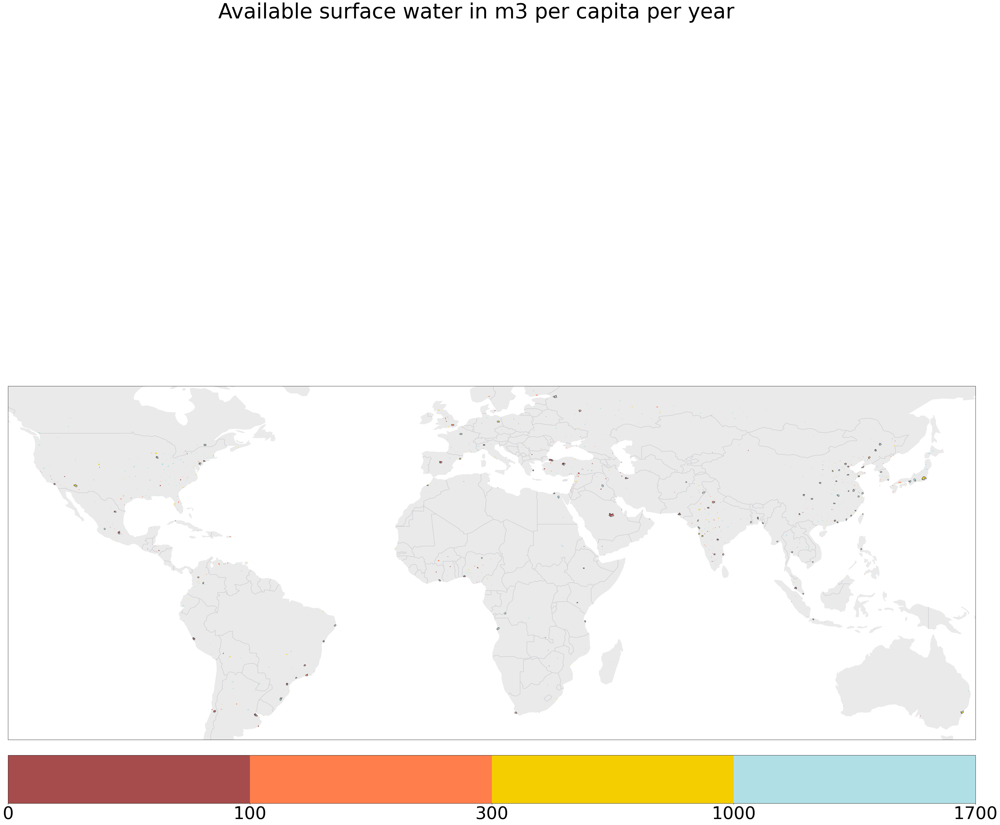

In [50]:
main_plot(-132, 155, -42, 63, linewidth=0.5, padding=0.5)

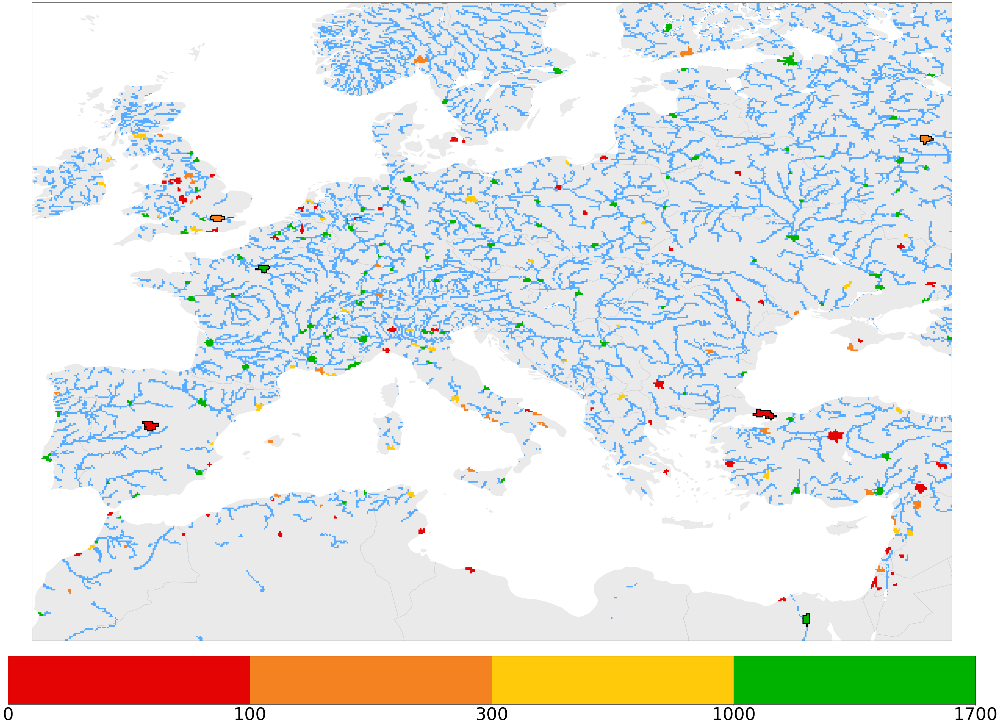

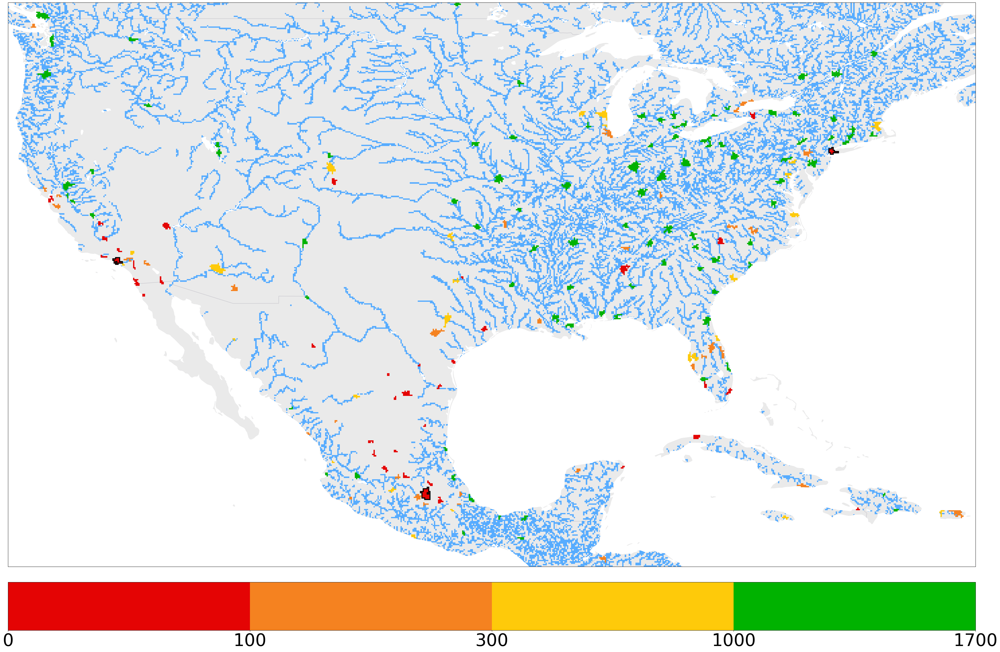

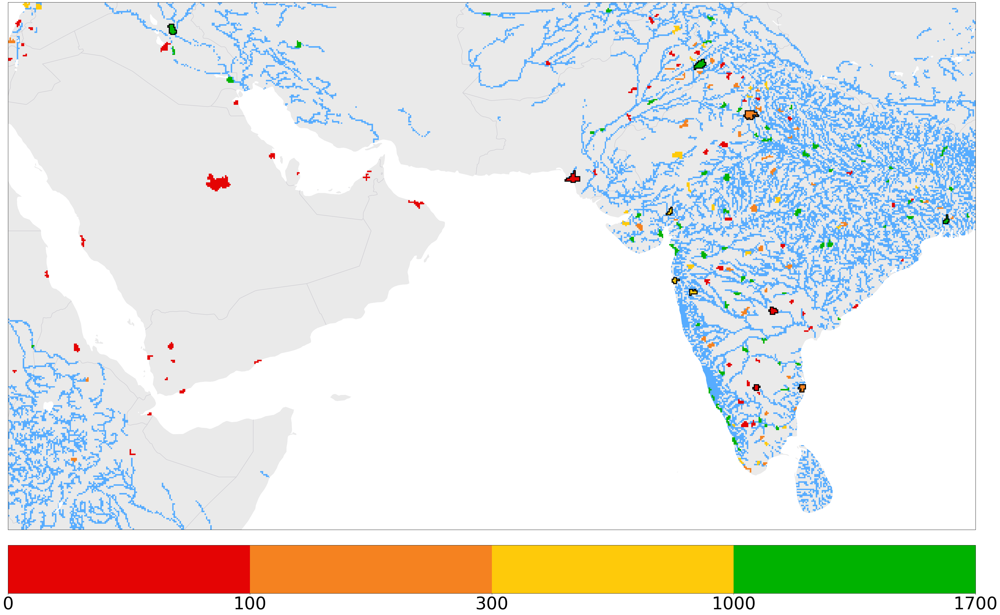

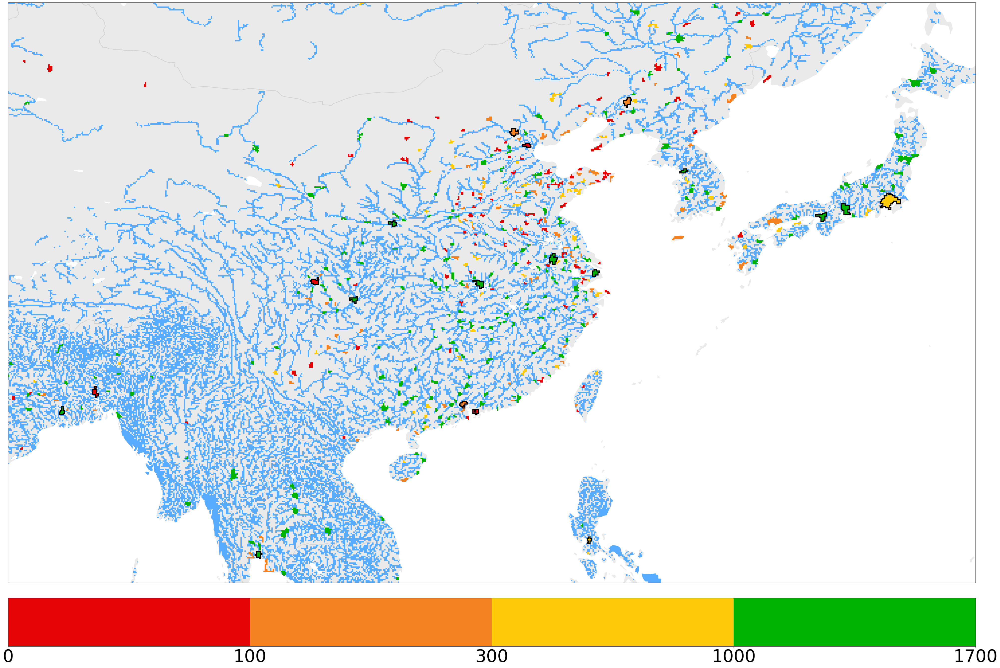

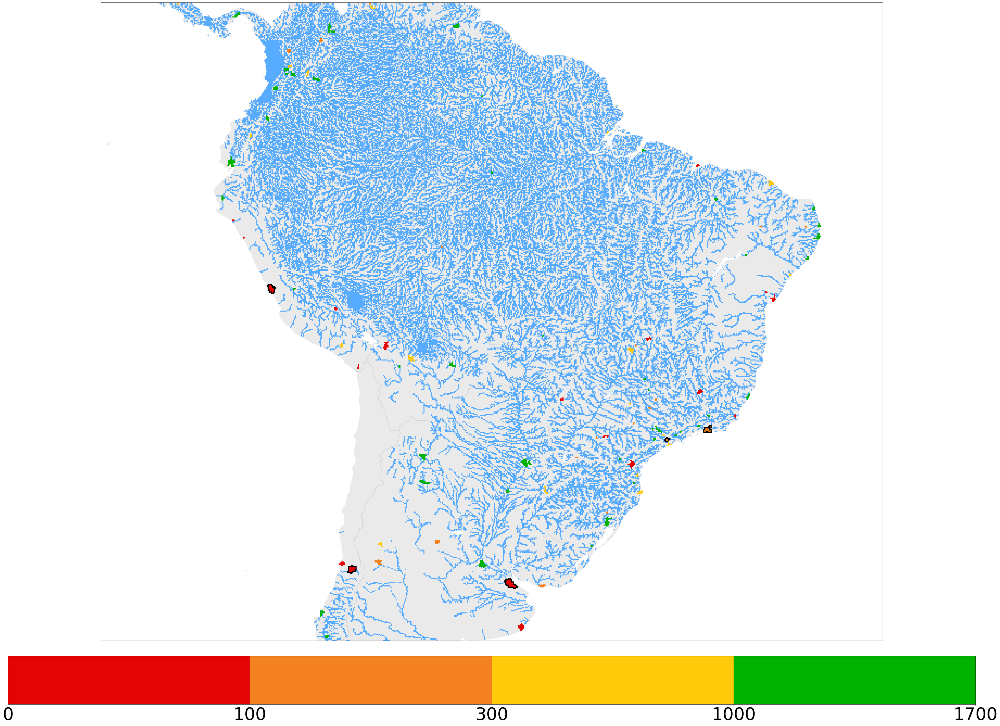

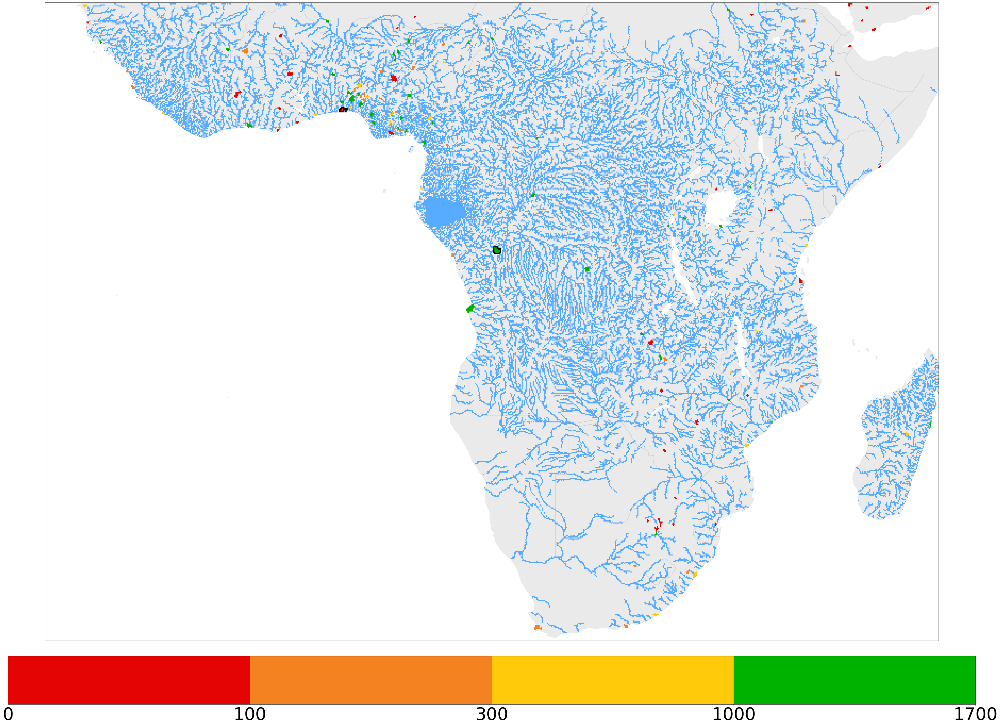

In [142]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import numpy as np
import os
import matplotlib.colors as mcolors

#各都市が利用する主河道のみを記述する方法

def geography(left, right, bottom, top):
    #
    resolution = 12
    #
    upperindex = (90-top)*resolution
    lowerindex = (90-bottom)*resolution
    leftindex = (180+left)*resolution
    rightindex = (180+right)*resolution
    #
    rgnshape = (lowerindex-upperindex, rightindex-leftindex)
    #
    img_extent = (left, right, bottom, top)
    
    return upperindex, lowerindex, leftindex, rightindex, rgnshape, img_extent

def draw_mask_sotowaku_outer(extent, mask_cropped, ax=None, sotowaku_color='#dc143c', linewidth=5, padding=0.1, pop_thres=5e6):
    """
    zorder = 0: デフォルトの最背面(gridをzorder=0に設定)
    zorder = 1: 赤色の外枠(citymask)
    
    extent: (x_left, x_right, y_bottom, y_top)
    mask_cropped: マスクされた都市域の2D配列
    ax: プロットする軸
    sotowaku_color: 枠線の色
    linewidth: 枠線の太さ
    padding: 枠線を外側にシフトさせる量（度単位）
    """
    mask_cropped = np.ma.filled(mask_cropped, 0)

    # delta
    delta = 360/4320
    x_left = extent[0]
    y_top = extent[3]
    
    # outer
    upper_indices = []
    lower_indices = []
    left_indices = []
    right_indices = []
    rows, cols = mask_cropped.shape
    for i in range(rows-1):
        for j in range(cols-1):
            if mask_cropped[i, j] > pop_thres and mask_cropped[i, j] != 0:
                if i > 0 and mask_cropped[i-1, j] == 0:
                    upper_indices.append((i, j))
                if i < rows-1 and mask_cropped[i+1, j] == 0:
                    lower_indices.append((i, j))
                if j > 0 and mask_cropped[i, j-1] == 0:
                    left_indices.append((i, j))
                if j < cols-1 and mask_cropped[i, j+1] == 0:
                    right_indices.append((i, j))

    # extent
    projection = ccrs.PlateCarree()

    # city mask
    for up in upper_indices:
        x_index = x_left + delta*(up[1])
        y_index = y_top - delta*(up[0]) + padding * delta
        ax.plot([x_index, x_index+delta], [y_index, y_index], color=sotowaku_color, transform=projection, linewidth=linewidth, zorder=1) # top
    for lo in lower_indices:
        x_index = x_left + delta*(lo[1])
        y_index = y_top - delta*(lo[0]+1) - padding * delta
        ax.plot([x_index, x_index+delta], [y_index, y_index], color=sotowaku_color, transform=projection, linewidth=linewidth, zorder=1) # bottom
    for le in left_indices:
        x_index = x_left + delta*(le[1]) - padding * delta
        y_index = y_top - delta*(le[0]+1)
        ax.plot([x_index, x_index], [y_index, y_index+delta], color=sotowaku_color, transform=projection, linewidth=linewidth, zorder=1) # left
    for ri in right_indices:
        x_index = x_left + delta*(ri[1]+1) + padding * delta
        y_index = y_top - delta*(ri[0]+1)
        ax.plot([x_index, x_index], [y_index, y_index+delta], color=sotowaku_color, transform=projection, linewidth=linewidth, zorder=1) # right

    return ax

def toy_plot(left, right, bottom, top, linewidth=5, padding=0.1):
    h08dir = '/mnt/c/Users/tsimk/Downloads/dotfiles/h08'
    upperindex, lowerindex, leftindex, rightindex, rgnshape, img_extent = geography(left, right, bottom, top)
    
    # wsi/pre/population_m3year.ipynb
    population_path = f'{h08dir}/wsi/dat/population/population_threshold_world.npy'
    population = np.load(population_path)
    population_cropped = population[upperindex:lowerindex, leftindex:rightindex]
    
    # wsi/pre/availability_m3year.ipynb
    availability_path = f'{h08dir}/wsi/dat/availablewater/availablewater_threshold_world.npy'
    availability = np.load(availability_path)
    availability_cropped = availability[upperindex:lowerindex, leftindex:rightindex]

    # discharge
    threshold = 0.3*1e6*1000
    riv_path = f'{h08dir}/wsi/dat/riv_out_/W5E5LR__00000000.gl5'
    rivout = np.fromfile(riv_path, dtype='float32').reshape(2160, 4320)
    rivout_cropped = rivout[upperindex:lowerindex, leftindex:rightindex] * 60 * 60 * 24 * 365 / 1000
    rivout_masked = np.ma.masked_where(rivout_cropped==0, rivout_cropped)
    rivout_thres = np.ma.masked_where(rivout_masked<threshold, rivout_masked)
    
    # wsi/pre/MPCY_citylonlat_citygrid.ipynb
    grid_path = f'{h08dir}/wsi/dat/cmy/world_citygrid.npy'
    citygrid = np.load(grid_path)
    citygrid_masked = np.ma.masked_where(citygrid==0, citygrid)
    region = citygrid_masked[upperindex:lowerindex, leftindex:rightindex]
    region_masked = np.ma.masked_where(region==0, region)
    
    bounds = [0, 100, 300, 1000, 1700]
    #cmap = mcolors.ListedColormap(['#e40404', '#f58220', '#feca0a', '#89989c'])
    #cmap = mcolors.ListedColormap(['#e40404', '#f58220', '#feca0a', '#f0fff0'])
    cmap = mcolors.ListedColormap(['#e40404', '#f58220', '#feca0a', '#00b200'])
    norm = mcolors.BoundaryNorm(bounds, cmap.N)
    
    plt.rcParams["font.size"] = 50
    projection = ccrs.PlateCarree()
    fig, ax = plt.subplots(figsize=(50,40), subplot_kw={'projection': projection})

    #river_cmap = mcolors.ListedColormap(['#60c9f8'])
    #river_cmap = mcolors.ListedColormap(['#3eb1c8'])
    river_cmap = mcolors.ListedColormap(['#57acff'])
    imr = ax.imshow(rivout_thres, 
                    extent=img_extent,
                    cmap=river_cmap,
                    transform=projection,
                    zorder=-2
                   )
    
    imd = ax.imshow(region_masked, 
                  cmap= cmap,
                  norm = norm,
                  extent=img_extent,
                  transform=projection, 
                 )
    
    ax.add_feature(cfeature.LAND, edgecolor='none', facecolor='#eaeaea', zorder=-3)
    ax.add_feature(cfeature.OCEAN, edgecolor='none', facecolor='#ffffff')
    ax.add_feature(cfeature.LAKES, edgecolor='none', facecolor='#ffffff', zorder=-1)
    ax.add_feature(cfeature.COASTLINE, linewidth=0.1,edgecolor='#d0cfd4')
    ax.add_feature(cfeature.BORDERS, linestyle='-', linewidth=1.5, edgecolor='#d0cfd4', zorder=-3)
    ax.gridlines(visible=False)
    cbar = fig.colorbar(imd, ax=ax, orientation='horizontal', pad=0.02)
    draw_mask_sotowaku_outer(img_extent, population_cropped, ax=ax, sotowaku_color='black', linewidth=linewidth, padding=padding, pop_thres=5e6)
    plt.show()

linewidth = 3
padding = 0.0
toy_plot(-10, 39, 29, 63, linewidth=linewidth, padding=padding)
toy_plot(-125, -65, 15, 50, linewidth=linewidth, padding=padding)
toy_plot(35 ,90, 5, 35, linewidth=linewidth, padding=padding)
toy_plot(85, 145, 12, 48, linewidth=linewidth, padding=padding)
toy_plot(-90, -30, -39, 10, linewidth=linewidth, padding=padding)
toy_plot(-20, 50, -35, 15, linewidth=linewidth, padding=padding)

In [164]:
#各都市が利用する主河道のみを記述する方法

import os
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import numpy as np
import pandas as pd
import matplotlib.colors as mcolors

def l_coordinate_to_tuple(lcoordinate, a=2160, b=4320):
    lat_l = ((lcoordinate - 1) // b)
    lon_l = (lcoordinate) % b - 1
    return (lat_l, lon_l)

def nxtl2nxtxy(rgnfile, upperindex, leftindex):
    vfunc = np.vectorize(l_coordinate_to_tuple, otypes=[tuple])
    riv_nxtxy = np.empty(rgnfile.shape, dtype=tuple)
    mask = ~np.isnan(rgnfile)
    riv_nxtxy[mask] = vfunc(rgnfile[mask])
    riv_nxtxy_shape = (riv_nxtxy.shape[0], riv_nxtxy.shape[1], 2)
    
    riv_nxtxy_lst = []
    for row in riv_nxtxy:
        for y, x in row:
            modified_y = y - upperindex
            modified_x = x - leftindex
            riv_nxtxy_lst.append((modified_y, modified_x))

    riv_nxtxy_cropped = np.array(riv_nxtxy_lst).reshape(riv_nxtxy_shape)
    riv_nxtxy_cropped = riv_nxtxy_cropped.astype(int)
    return riv_nxtxy_cropped
    
def prf_river():
    h08dir = '/mnt/c/Users/tsimk/Downloads/dotfiles/h08'
    prf_dir = f'{h08dir}/global_city/dat/cty_prf_'
    rivnum_path = f'{h08dir}/global_city/dat/riv_num_/rivnum.CAMA.gl5'
    rivara_path = f"{h08dir}/global_city/dat/riv_ara_/rivara.CAMA.gl5"
    rivnxl_path = f"{h08dir}/global_city/dat/riv_nxl_/rivnxl.CAMA.gl5"
    
    rivnum_gl5 = np.fromfile(rivnum_path, 'float32').reshape(2160, 4320)
    rivara_gl5 = np.fromfile(rivara_path, 'float32').reshape(2160, 4320)
    rivnxl_gl5 = np.fromfile(rivnxl_path, 'float32').reshape(2160, 4320)
    
    riv_nxlonlat_cropped = nxtl2nxtxy(rivnxl_gl5, 0, 0)
    
    riv_path_array = np.zeros((2160, 4320))
    for num in range(1860):
        city_num = num+1
        print(f'city_num {city_num} start')
        prf_path = f'{prf_dir}/vld_cty_/city_{city_num:08}.gl5'
        
        # remove overlap
        overlap_path = f'{h08dir}/global_city/dat/cty_lst_/gpw4/overlap_hidden_only.txt'
        with open(overlap_path, 'r') as f:
            numbers = [int(line.strip()) for line in f]
        
        if not os.path.exists(prf_path):
            print(f'{city_num} is invalid prf')
            continue

        if city_num in numbers:
            print(f'{city_num} is overlapped city')
            continue

        # existing and not overlapped
        prf = np.fromfile(prf_path, dtype='float32').reshape(2160, 4320)
        rivnum_mask = np.ma.masked_where(prf == 0, rivnum_gl5)
        rivnum_list = np.unique(rivnum_mask)[:-1]
        
        # coord of purficication
        coords_prf = []
        for uid in rivnum_list:
            prf_coord = np.where((prf == 1) & (rivnum_gl5 == uid))
            coords_prf.append(prf_coord)
        
        # downstream trajectory
        for cid in range(len(coords_prf)):
            visited_coords = set()
            riv_path_array[coords_prf[cid][0][0], coords_prf[cid][1][0]] = city_num
            
            if len(coords_prf) > 0:
                target_coord = (coords_prf[cid][0][0], coords_prf[cid][1][0])
                
                while True:
                    if target_coord in visited_coords:
                        break
                    visited_coords.add(target_coord)
                    
                    next_coord = riv_nxlonlat_cropped[target_coord[0], target_coord[1]]
                    if next_coord.size == 0 or next_coord.shape != (2,):
                        break
                    
                    next_coord = (next_coord[0], next_coord[1])
                    riv_path_array[next_coord[0], next_coord[1]] = city_num
                    target_coord = next_coord
                    
        # upstream trajectory
        for cid in range(len(coords_prf)):
            visited_coords = set()
            riv_path_array[coords_prf[cid][0][0], coords_prf[cid][1][0]] = city_num
            
            if len(coords_prf) > 0:
                target_coord = (coords_prf[cid][0][0], coords_prf[cid][1][0])
                
                while True:
                    if target_coord in visited_coords:
                        break
                    visited_coords.add(target_coord)
                    
                    matched_coords = np.argwhere(np.all(target_coord == riv_nxlonlat_cropped, axis=2))
                    if len(matched_coords) == 0:
                        break
                    unvisited_matched = [tuple(coord) for coord in matched_coords if tuple(coord) not in visited_coords]
                    if not unvisited_matched:
                        break
                    rivara_values = [rivara_gl5[coord[0], coord[1]] for coord in unvisited_matched]
                    largest_coord = unvisited_matched[np.argmax(rivara_values)]
                    riv_path_array[largest_coord[0], largest_coord[1]] = city_num
                    target_coord = largest_coord 
        
    return riv_path_array

#riv_path_array = prf_river()

city_num 1 start
city_num 2 start
city_num 3 start
city_num 4 start
city_num 5 start
city_num 6 start
city_num 7 start
city_num 8 start
city_num 9 start
city_num 10 start
city_num 11 start
city_num 12 start
city_num 13 start
city_num 14 start
city_num 15 start
city_num 16 start
city_num 17 start
city_num 18 start
city_num 19 start
city_num 20 start
city_num 21 start
city_num 22 start
city_num 23 start
city_num 24 start
city_num 25 start
city_num 26 start
city_num 27 start
city_num 28 start
city_num 29 start
city_num 30 start
city_num 31 start
city_num 32 start
city_num 33 start
city_num 34 start
city_num 35 start
city_num 36 start
city_num 37 start
city_num 38 start
city_num 39 start
city_num 40 start
city_num 41 start
city_num 42 start
42 is overlapped city
city_num 43 start
43 is overlapped city
city_num 44 start
44 is overlapped city
city_num 45 start
city_num 46 start
city_num 47 start
city_num 48 start
city_num 49 start
city_num 50 start
city_num 51 start
city_num 52 start
city_nu

In [166]:
#h08dir = '/mnt/c/Users/tsimk/Downloads/dotfiles/h08'
#riv_path_array.astype(np.float32).tofile(f"{h08dir}/wsi/dat/riv_path/riv_path_array.gl5")

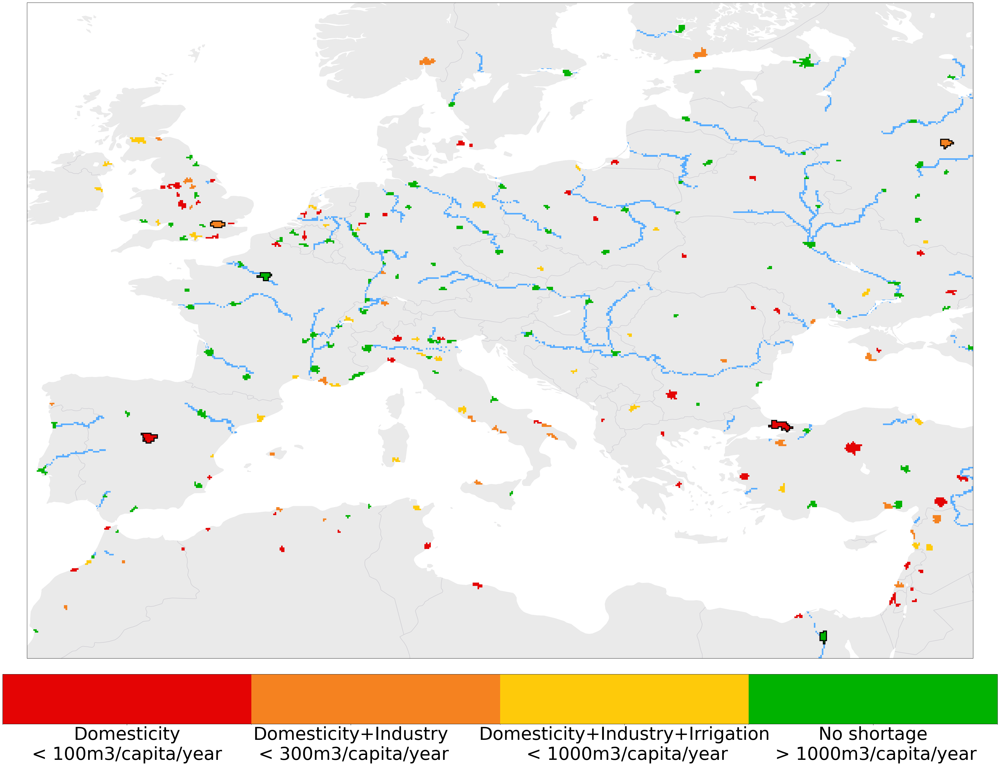

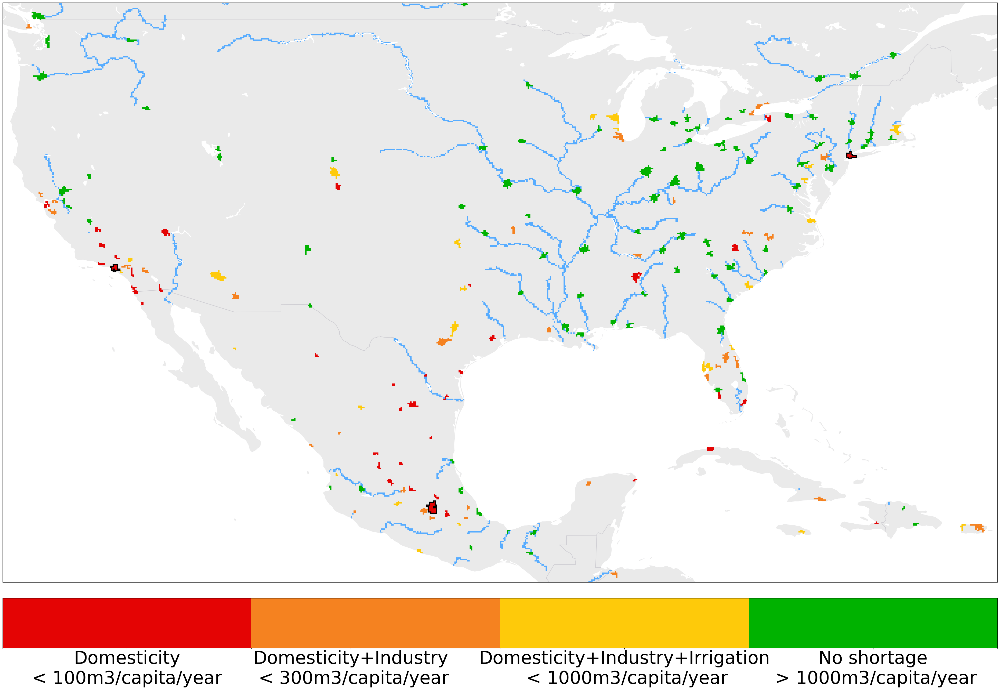

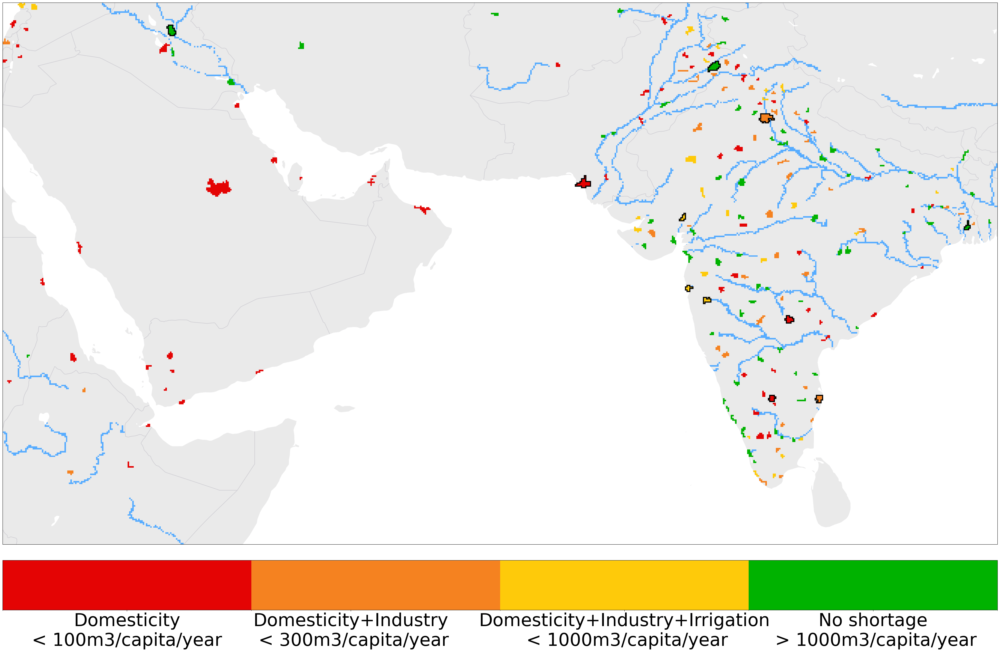

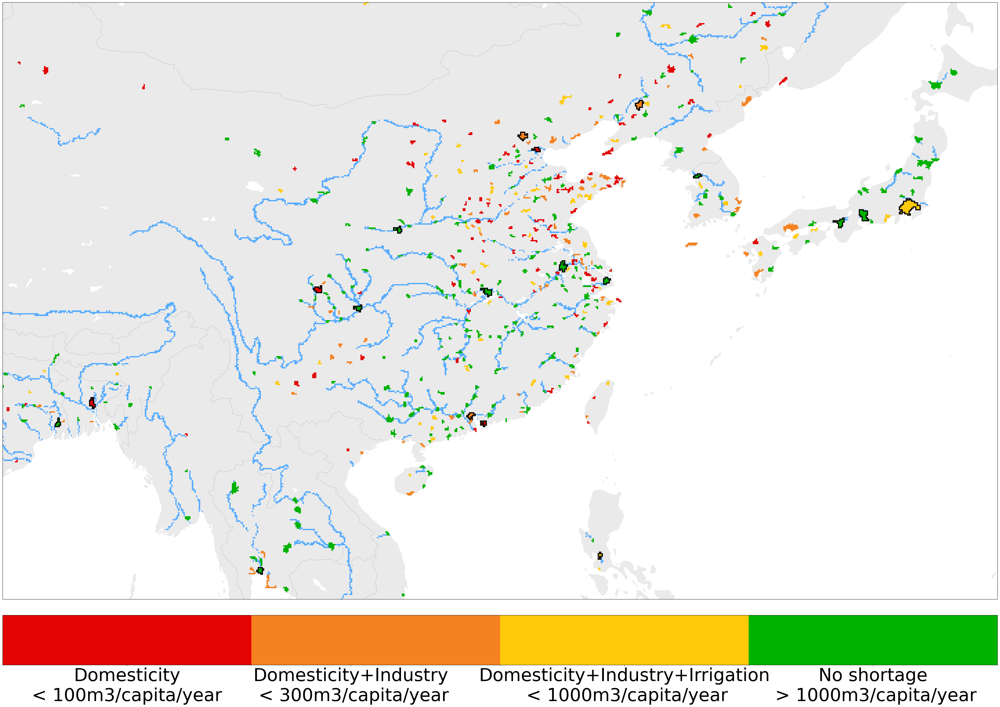

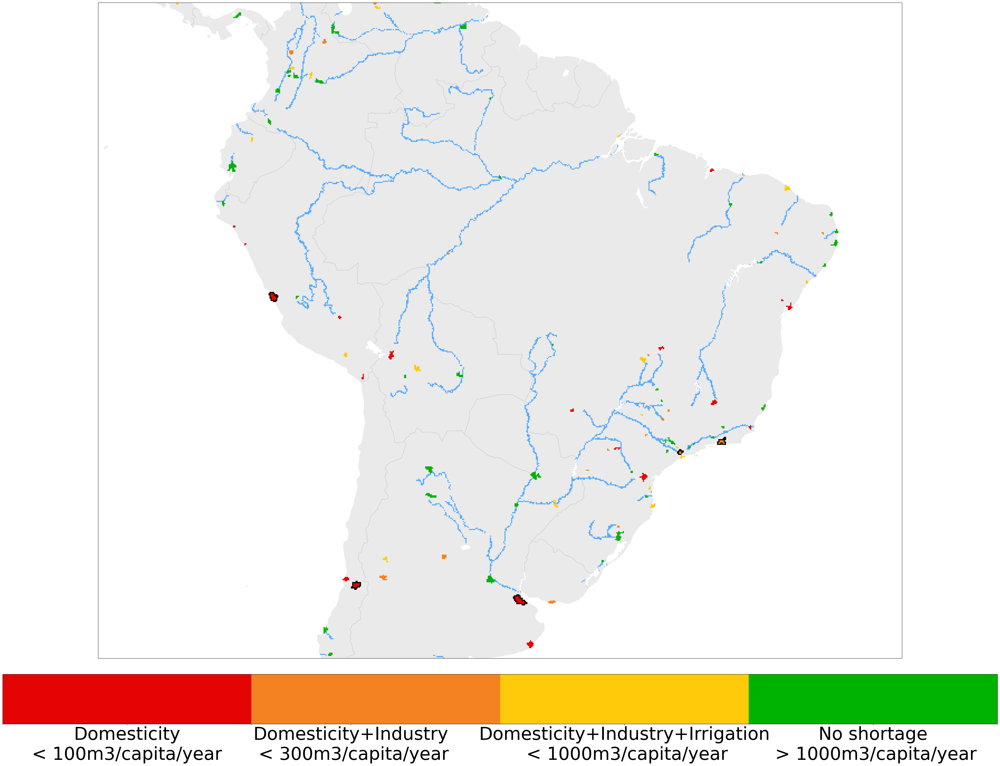

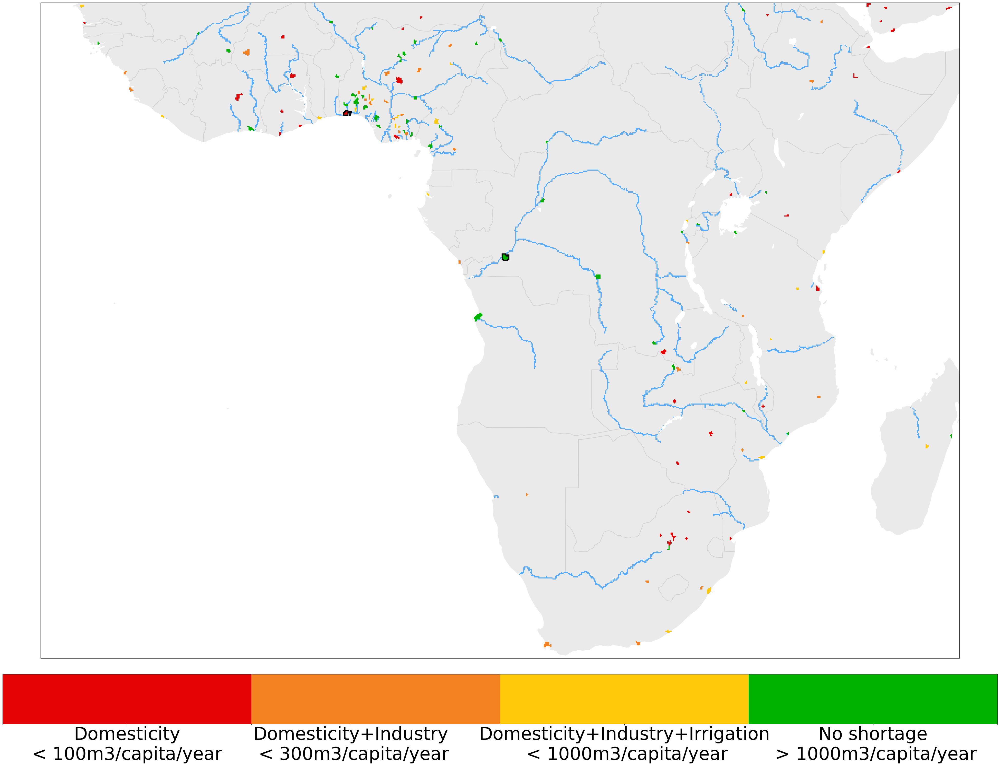

In [214]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import numpy as np
import os
import matplotlib.colors as mcolors

#各都市が利用する主河道のみを記述する方法

def geography(left, right, bottom, top):
    #
    resolution = 12
    #
    upperindex = (90-top)*resolution
    lowerindex = (90-bottom)*resolution
    leftindex = (180+left)*resolution
    rightindex = (180+right)*resolution
    #
    rgnshape = (lowerindex-upperindex, rightindex-leftindex)
    #
    img_extent = (left, right, bottom, top)
    
    return upperindex, lowerindex, leftindex, rightindex, rgnshape, img_extent

def draw_mask_sotowaku_outer(extent, mask_cropped, ax=None, sotowaku_color='#dc143c', linewidth=5, padding=0.1, pop_thres=5e6):
    """
    zorder = 0: デフォルトの最背面(gridをzorder=0に設定)
    zorder = 1: 赤色の外枠(citymask)
    
    extent: (x_left, x_right, y_bottom, y_top)
    mask_cropped: マスクされた都市域の2D配列
    ax: プロットする軸
    sotowaku_color: 枠線の色
    linewidth: 枠線の太さ
    padding: 枠線を外側にシフトさせる量（度単位）
    """
    mask_cropped = np.ma.filled(mask_cropped, 0)

    # delta
    delta = 360/4320
    x_left = extent[0]
    y_top = extent[3]
    
    # outer
    upper_indices = []
    lower_indices = []
    left_indices = []
    right_indices = []
    rows, cols = mask_cropped.shape
    for i in range(rows-1):
        for j in range(cols-1):
            if mask_cropped[i, j] > pop_thres and mask_cropped[i, j] != 0:
                if i > 0 and mask_cropped[i-1, j] == 0:
                    upper_indices.append((i, j))
                if i < rows-1 and mask_cropped[i+1, j] == 0:
                    lower_indices.append((i, j))
                if j > 0 and mask_cropped[i, j-1] == 0:
                    left_indices.append((i, j))
                if j < cols-1 and mask_cropped[i, j+1] == 0:
                    right_indices.append((i, j))

    # extent
    projection = ccrs.PlateCarree()

    # city mask
    for up in upper_indices:
        x_index = x_left + delta*(up[1])
        y_index = y_top - delta*(up[0]) + padding * delta
        ax.plot([x_index, x_index+delta], [y_index, y_index], color=sotowaku_color, transform=projection, linewidth=linewidth, zorder=1) # top
    for lo in lower_indices:
        x_index = x_left + delta*(lo[1])
        y_index = y_top - delta*(lo[0]+1) - padding * delta
        ax.plot([x_index, x_index+delta], [y_index, y_index], color=sotowaku_color, transform=projection, linewidth=linewidth, zorder=1) # bottom
    for le in left_indices:
        x_index = x_left + delta*(le[1]) - padding * delta
        y_index = y_top - delta*(le[0]+1)
        ax.plot([x_index, x_index], [y_index, y_index+delta], color=sotowaku_color, transform=projection, linewidth=linewidth, zorder=1) # left
    for ri in right_indices:
        x_index = x_left + delta*(ri[1]+1) + padding * delta
        y_index = y_top - delta*(ri[0]+1)
        ax.plot([x_index, x_index], [y_index, y_index+delta], color=sotowaku_color, transform=projection, linewidth=linewidth, zorder=1) # right

    return ax

def toy_plot(left, right, bottom, top, linewidth=5, padding=0.1):
    h08dir = '/mnt/c/Users/tsimk/Downloads/dotfiles/h08'
    upperindex, lowerindex, leftindex, rightindex, rgnshape, img_extent = geography(left, right, bottom, top)
    
    # wsi/pre/population_m3year.ipynb
    population_path = f'{h08dir}/wsi/dat/population/population_threshold_world.npy'
    population = np.load(population_path)
    population_cropped = population[upperindex:lowerindex, leftindex:rightindex]
    
    # wsi/pre/availability_m3year.ipynb
    availability_path = f'{h08dir}/wsi/dat/availablewater/availablewater_threshold_world.npy'
    availability = np.load(availability_path)
    availability_cropped = availability[upperindex:lowerindex, leftindex:rightindex]

    # rive path array
    riv_path_array_path = f'{h08dir}/wsi/dat/riv_path/riv_path_array.gl5'
    riv_path_array = np.fromfile(riv_path_array_path, dtype='float32').reshape(2160, 4320)

    # discharge
    pop_thres=5e6
    threshold = 5*1e6*1000
    riv_path = f'{h08dir}/wsi/dat/riv_out_/W5E5LR__00000000.gl5'
    rivout = np.fromfile(riv_path, dtype='float32').reshape(2160, 4320)
    rivout_tmp = np.ma.masked_where(riv_path_array==0, rivout)
    rivout_cropped = rivout_tmp[upperindex:lowerindex, leftindex:rightindex] * 60 * 60 * 24 * 365 / 1000
    rivout_masked = np.ma.masked_where(rivout_cropped==0, rivout_cropped)
    rivout_thres = np.ma.masked_where(rivout_masked<threshold, rivout_masked)
    
    # wsi/pre/MPCY_citylonlat_citygrid.ipynb
    grid_path = f'{h08dir}/wsi/dat/cmy/world_citygrid.npy'
    citygrid = np.load(grid_path)
    citygrid_masked = np.ma.masked_where(citygrid==0, citygrid)
    region = citygrid_masked[upperindex:lowerindex, leftindex:rightindex]
    region_masked = np.ma.masked_where(region==0, region)
    
    bounds = [0, 100, 300, 1000, 1700]
    cmap = mcolors.ListedColormap(['#e40404', '#f58220', '#feca0a', '#00b200'])
    norm = mcolors.BoundaryNorm(bounds, cmap.N)
    
    plt.rcParams["font.size"] = 50
    projection = ccrs.PlateCarree()
    fig, ax = plt.subplots(figsize=(50,40), subplot_kw={'projection': projection})

    river_cmap = mcolors.ListedColormap(['#57acff'])
    imr = ax.imshow(rivout_thres, 
                    extent=img_extent,
                    cmap=river_cmap,
                    transform=projection,
                    zorder=-2
                   )
    
    imd = ax.imshow(region_masked, 
                  cmap= cmap,
                  norm = norm,
                  extent=img_extent,
                  transform=projection, 
                 )
    
    ax.add_feature(cfeature.LAND, edgecolor='none', facecolor='#eaeaea', zorder=-3)
    ax.add_feature(cfeature.OCEAN, edgecolor='none', facecolor='#ffffff')
    ax.add_feature(cfeature.LAKES, edgecolor='none', facecolor='#ffffff', zorder=-1)
    ax.add_feature(cfeature.COASTLINE, linewidth=0.1,edgecolor='#d0cfd4')
    ax.add_feature(cfeature.BORDERS, linestyle='-', linewidth=1.5, edgecolor='#d0cfd4', zorder=-3)
    ax.gridlines(visible=False)
    cbar = fig.colorbar(imd, ax=ax, orientation='horizontal', pad=0.02)
    cbar.set_ticks([30, 180, 650, 1450])  # Ticksの設定
    cbar.set_ticklabels(['Domesticity\n< 100m3/capita/year', 
                         'Domesticity+Industry\n < 300m3/capita/year', 
                         'Domesticity+Industry+Irrigation\n < 1000m3/capita/year', 
                         'No shortage\n > 1000m3/capita/year'])  # Tick labelsの設定
    draw_mask_sotowaku_outer(img_extent, population_cropped, ax=ax, sotowaku_color='black', linewidth=linewidth, padding=padding, pop_thres=pop_thres)
    plt.show()

linewidth = 3
padding = 0.0
toy_plot(-10, 39, 29, 63, linewidth=linewidth, padding=padding)
toy_plot(-125, -65, 15, 50, linewidth=linewidth, padding=padding)
toy_plot(35 ,90, 5, 35, linewidth=linewidth, padding=padding)
toy_plot(85, 145, 12, 48, linewidth=linewidth, padding=padding)
toy_plot(-90, -30, -39, 10, linewidth=linewidth, padding=padding)
toy_plot(-20, 50, -35, 15, linewidth=linewidth, padding=padding)

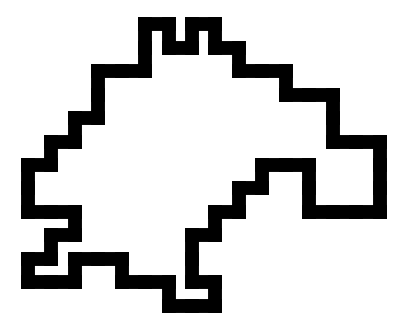

In [219]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import numpy as np
import os
import matplotlib.colors as mcolors

#各都市が利用する主河道のみを記述する方法

def geography(left, right, bottom, top):
    #
    resolution = 12
    #
    upperindex = (90-top)*resolution
    lowerindex = (90-bottom)*resolution
    leftindex = (180+left)*resolution
    rightindex = (180+right)*resolution
    #
    rgnshape = (lowerindex-upperindex, rightindex-leftindex)
    #
    img_extent = (left, right, bottom, top)
    
    return upperindex, lowerindex, leftindex, rightindex, rgnshape, img_extent

def draw_mask_sotowaku_outer(extent, mask_cropped, ax=None, sotowaku_color='#dc143c', linewidth=5, padding=0.1, pop_thres=5e6):
    """
    zorder = 0: デフォルトの最背面(gridをzorder=0に設定)
    zorder = 1: 赤色の外枠(citymask)
    
    extent: (x_left, x_right, y_bottom, y_top)
    mask_cropped: マスクされた都市域の2D配列
    ax: プロットする軸
    sotowaku_color: 枠線の色
    linewidth: 枠線の太さ
    padding: 枠線を外側にシフトさせる量（度単位）
    """
    mask_cropped = np.ma.filled(mask_cropped, 0)

    # delta
    delta = 360/4320
    x_left = extent[0]
    y_top = extent[3]
    
    # outer
    upper_indices = []
    lower_indices = []
    left_indices = []
    right_indices = []
    rows, cols = mask_cropped.shape
    for i in range(rows-1):
        for j in range(cols-1):
            if mask_cropped[i, j] > pop_thres and mask_cropped[i, j] != 0:
                if i > 0 and mask_cropped[i-1, j] == 0:
                    upper_indices.append((i, j))
                if i < rows-1 and mask_cropped[i+1, j] == 0:
                    lower_indices.append((i, j))
                if j > 0 and mask_cropped[i, j-1] == 0:
                    left_indices.append((i, j))
                if j < cols-1 and mask_cropped[i, j+1] == 0:
                    right_indices.append((i, j))

    # extent
    projection = ccrs.PlateCarree()

    # city mask
    for up in upper_indices:
        x_index = x_left + delta*(up[1])
        y_index = y_top - delta*(up[0]) + padding * delta
        ax.plot([x_index, x_index+delta], [y_index, y_index], color=sotowaku_color, transform=projection, linewidth=linewidth, zorder=1) # top
    for lo in lower_indices:
        x_index = x_left + delta*(lo[1])
        y_index = y_top - delta*(lo[0]+1) - padding * delta
        ax.plot([x_index, x_index+delta], [y_index, y_index], color=sotowaku_color, transform=projection, linewidth=linewidth, zorder=1) # bottom
    for le in left_indices:
        x_index = x_left + delta*(le[1]) - padding * delta
        y_index = y_top - delta*(le[0]+1)
        ax.plot([x_index, x_index], [y_index, y_index+delta], color=sotowaku_color, transform=projection, linewidth=linewidth, zorder=1) # left
    for ri in right_indices:
        x_index = x_left + delta*(ri[1]+1) + padding * delta
        y_index = y_top - delta*(ri[0]+1)
        ax.plot([x_index, x_index], [y_index, y_index+delta], color=sotowaku_color, transform=projection, linewidth=linewidth, zorder=1) # right

    return ax

def toy_plot(left, right, bottom, top, linewidth=5, padding=0.1):
    h08dir = '/mnt/c/Users/tsimk/Downloads/dotfiles/h08'
    upperindex, lowerindex, leftindex, rightindex, rgnshape, img_extent = geography(left, right, bottom, top)
    
    # wsi/pre/population_m3year.ipynb
    population_path = f'{h08dir}/wsi/dat/population/population_threshold_world.npy'
    population = np.load(population_path)
    population_cropped = population[upperindex:lowerindex, leftindex:rightindex]
    
    # wsi/pre/availability_m3year.ipynb
    availability_path = f'{h08dir}/wsi/dat/availablewater/availablewater_threshold_world.npy'
    availability = np.load(availability_path)
    availability_cropped = availability[upperindex:lowerindex, leftindex:rightindex]

    # rive path array
    riv_path_array_path = f'{h08dir}/wsi/dat/riv_path/riv_path_array.gl5'
    riv_path_array = np.fromfile(riv_path_array_path, dtype='float32').reshape(2160, 4320)

    # discharge
    pop_thres=5e6
    threshold = 5*1e6*1000
    riv_path = f'{h08dir}/wsi/dat/riv_out_/W5E5LR__00000000.gl5'
    rivout = np.fromfile(riv_path, dtype='float32').reshape(2160, 4320)
    rivout_tmp = np.ma.masked_where(riv_path_array==0, rivout)
    rivout_cropped = rivout_tmp[upperindex:lowerindex, leftindex:rightindex] * 60 * 60 * 24 * 365 / 1000
    rivout_masked = np.ma.masked_where(rivout_cropped==0, rivout_cropped)
    rivout_thres = np.ma.masked_where(rivout_masked<threshold, rivout_masked)
    
    # wsi/pre/MPCY_citylonlat_citygrid.ipynb
    grid_path = f'{h08dir}/wsi/dat/cmy/world_citygrid.npy'
    citygrid = np.load(grid_path)
    citygrid_masked = np.ma.masked_where(citygrid==0, citygrid)
    region = citygrid_masked[upperindex:lowerindex, leftindex:rightindex]
    region_masked = np.ma.masked_where(region==0, region)
    
    bounds = [0, 100, 300, 1000, 1700]
    cmap = mcolors.ListedColormap(['#e40404', '#f58220', '#feca0a', '#00b200'])
    norm = mcolors.BoundaryNorm(bounds, cmap.N)
    
    plt.rcParams["font.size"] = 50
    projection = ccrs.PlateCarree()
    fig, ax = plt.subplots(figsize=(5,5), subplot_kw={'projection': projection})

    river_cmap = mcolors.ListedColormap(['#57acff'])
    
    ax.gridlines(visible=False)
    ax.spines['geo'].set_visible(False)
    draw_mask_sotowaku_outer(img_extent, population_cropped, ax=ax, sotowaku_color='black', linewidth=linewidth, padding=padding, pop_thres=pop_thres)
    plt.show()

linewidth = 10
padding = 0.0
toy_plot(138, 141, 34, 38, linewidth=linewidth, padding=padding)

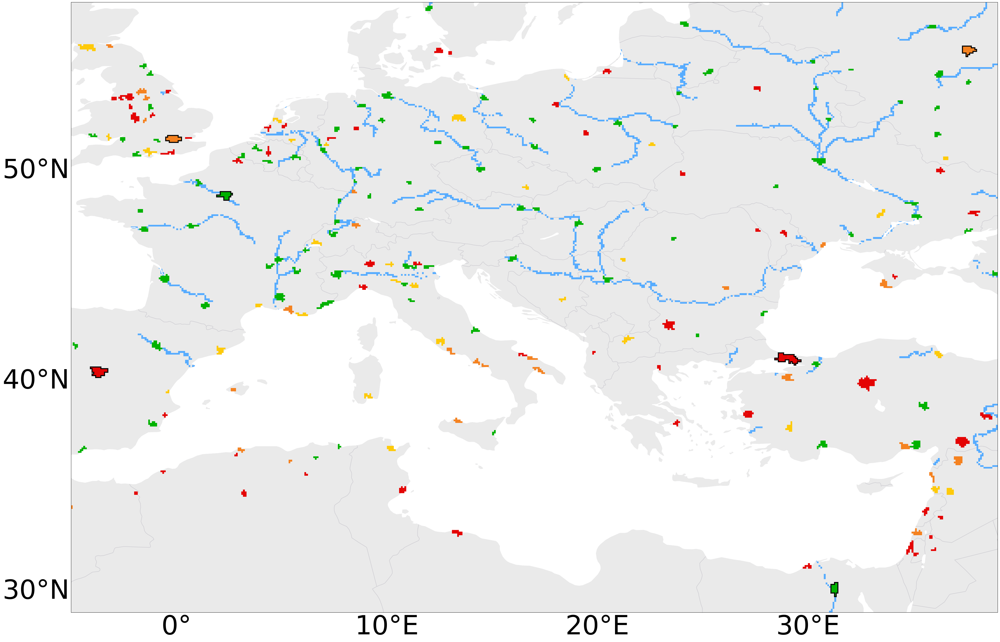

In [189]:
# paper review

import cartopy.crs as ccrs
import cartopy.feature as cfeature
import numpy as np
import os
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib.ticker as mticker

#各都市が利用する主河道のみを記述する方法

def geography(left, right, bottom, top):
    #
    resolution = 12
    #
    upperindex = (90-top)*resolution
    lowerindex = (90-bottom)*resolution
    leftindex = (180+left)*resolution
    rightindex = (180+right)*resolution
    #
    rgnshape = (lowerindex-upperindex, rightindex-leftindex)
    #
    img_extent = (left, right, bottom, top)
    
    return upperindex, lowerindex, leftindex, rightindex, rgnshape, img_extent

def draw_mask_sotowaku_outer(extent, mask_cropped, ax=None, sotowaku_color='#dc143c', linewidth=5, padding=0.1, pop_thres=5e6):
    """
    zorder = 0: デフォルトの最背面(gridをzorder=0に設定)
    zorder = 1: 赤色の外枠(citymask)
    
    extent: (x_left, x_right, y_bottom, y_top)
    mask_cropped: マスクされた都市域の2D配列
    ax: プロットする軸
    sotowaku_color: 枠線の色
    linewidth: 枠線の太さ
    padding: 枠線を外側にシフトさせる量（度単位）
    """
    mask_cropped = np.ma.filled(mask_cropped, 0)

    # delta
    delta = 360/4320
    x_left = extent[0]
    y_top = extent[3]
    
    # outer
    upper_indices = []
    lower_indices = []
    left_indices = []
    right_indices = []
    rows, cols = mask_cropped.shape
    for i in range(rows-1):
        for j in range(cols-1):
            if mask_cropped[i, j] > pop_thres and mask_cropped[i, j] != 0:
                if i > 0 and mask_cropped[i-1, j] == 0:
                    upper_indices.append((i, j))
                if i < rows-1 and mask_cropped[i+1, j] == 0:
                    lower_indices.append((i, j))
                if j > 0 and mask_cropped[i, j-1] == 0:
                    left_indices.append((i, j))
                if j < cols-1 and mask_cropped[i, j+1] == 0:
                    right_indices.append((i, j))

    # extent
    projection = ccrs.PlateCarree()

    # city mask
    for up in upper_indices:
        x_index = x_left + delta*(up[1])
        y_index = y_top - delta*(up[0]) + padding * delta
        ax.plot([x_index, x_index+delta], [y_index, y_index], color=sotowaku_color, transform=projection, linewidth=linewidth, zorder=1) # top
    for lo in lower_indices:
        x_index = x_left + delta*(lo[1])
        y_index = y_top - delta*(lo[0]+1) - padding * delta
        ax.plot([x_index, x_index+delta], [y_index, y_index], color=sotowaku_color, transform=projection, linewidth=linewidth, zorder=1) # bottom
    for le in left_indices:
        x_index = x_left + delta*(le[1]) - padding * delta
        y_index = y_top - delta*(le[0]+1)
        ax.plot([x_index, x_index], [y_index, y_index+delta], color=sotowaku_color, transform=projection, linewidth=linewidth, zorder=1) # left
    for ri in right_indices:
        x_index = x_left + delta*(ri[1]+1) + padding * delta
        y_index = y_top - delta*(ri[0]+1)
        ax.plot([x_index, x_index], [y_index, y_index+delta], color=sotowaku_color, transform=projection, linewidth=linewidth, zorder=1) # right

    return ax

def paper_plot(left, right, bottom, top, linewidth=5, padding=0.1):
    # init 
    pop_thres=5e6
    threshold = 5*1e6*1000

    # path
    h08dir = '/mnt/c/Users/tsimk/Downloads/dotfiles/h08'
    upperindex, lowerindex, leftindex, rightindex, rgnshape, img_extent = geography(left, right, bottom, top)
    
    # wsi/pre/population_m3year.ipynb
    population_path = f'{h08dir}/wsi/dat/population/population_threshold_world.npy'
    population = np.load(population_path)
    population_cropped = population[upperindex:lowerindex, leftindex:rightindex]
    
    # wsi/pre/availability_m3year.ipynb
    availability_path = f'{h08dir}/wsi/dat/availablewater/availablewater_threshold_world.npy'
    availability = np.load(availability_path)
    availability_cropped = availability[upperindex:lowerindex, leftindex:rightindex]

    # wsi/pst/MPCY_background.ipynb
    riv_path_array_path = f'{h08dir}/wsi/dat/riv_path/riv_path_array.gl5'
    riv_path_array = np.fromfile(riv_path_array_path, dtype='float32').reshape(2160, 4320)
    
    # wsi/pre/MPCY_citylonlat_citygrid.ipynb
    grid_path = f'{h08dir}/wsi/dat/cmy/world_citygrid.npy'
    citygrid = np.load(grid_path)
    citygrid_masked = np.ma.masked_where(citygrid==0, citygrid)
    region = citygrid_masked[upperindex:lowerindex, leftindex:rightindex]
    region_masked = np.ma.masked_where(region==0, region)

    # discharge
    riv_path = f'{h08dir}/wsi/dat/riv_out_/W5E5LR__00000000.gl5'
    rivout = np.fromfile(riv_path, dtype='float32').reshape(2160, 4320)
    rivout_tmp = np.ma.masked_where(riv_path_array==0, rivout)
    rivout_cropped = rivout_tmp[upperindex:lowerindex, leftindex:rightindex] * 60 * 60 * 24 * 365 / 1000
    rivout_masked = np.ma.masked_where(rivout_cropped==0, rivout_cropped)
    rivout_thres = np.ma.masked_where(rivout_masked<threshold, rivout_masked)
    
    bounds = [0, 100, 300, 1000, 1700]
    cmap = mcolors.ListedColormap(['#e40404', '#f58220', '#feca0a', '#00b200'])
    norm = mcolors.BoundaryNorm(bounds, cmap.N)
    
    plt.rcParams["font.size"] = 50
    projection = ccrs.PlateCarree()
    fig, ax = plt.subplots(figsize=(50,40), subplot_kw={'projection': projection})

    river_cmap = mcolors.ListedColormap(['#57acff'])
    imr = ax.imshow(rivout_thres, 
                    extent=img_extent,
                    cmap=river_cmap,
                    transform=projection,
                    zorder=-2
                   )
    
    imd = ax.imshow(region_masked, 
                  cmap= cmap,
                  norm = norm,
                  extent=img_extent,
                  transform=projection, 
                 )
    
    ax.add_feature(cfeature.LAND, edgecolor='none', facecolor='#eaeaea', zorder=-3)
    ax.add_feature(cfeature.OCEAN, edgecolor='none', facecolor='#ffffff')
    ax.add_feature(cfeature.LAKES, edgecolor='none', facecolor='#ffffff', zorder=-1)
    ax.add_feature(cfeature.COASTLINE, linewidth=0.1,edgecolor='#d0cfd4')
    ax.add_feature(cfeature.BORDERS, linestyle='-', linewidth=1.5, edgecolor='#d0cfd4', zorder=-3)
    
    gl = ax.gridlines(draw_labels=True, zorder=2, color='gray', alpha=0.5, linestyle='--')
    gl.xlocator = mticker.FixedLocator(np.arange(round(left/10)*10, right, 10))
    gl.ylocator = mticker.FixedLocator(np.arange(round(bottom/10)*10, top, 10))
    gl.top_labels = False
    gl.right_labels = False
    gl.bottom_labels = True
    gl.left_labels = True
    gl.xlines = False
    gl.ylines = False
    gl.xlabel_style = {'size': 80, 'color': 'black'}
    gl.ylabel_style = {'size': 80, 'color': 'black'}
    
    ax.gridlines(visible=False)
    ax.spines['geo'].set_visible(True)
    
    #cbar = fig.colorbar(imd, ax=ax, orientation='horizontal', pad=0.02)
    draw_mask_sotowaku_outer(img_extent, population_cropped, ax=ax, sotowaku_color='black', linewidth=linewidth, padding=padding, pop_thres=pop_thres)
    plt.show()

linewidth = 3
padding = 0.0
paper_plot(-5, 39, 29, 58, linewidth=linewidth, padding=padding)

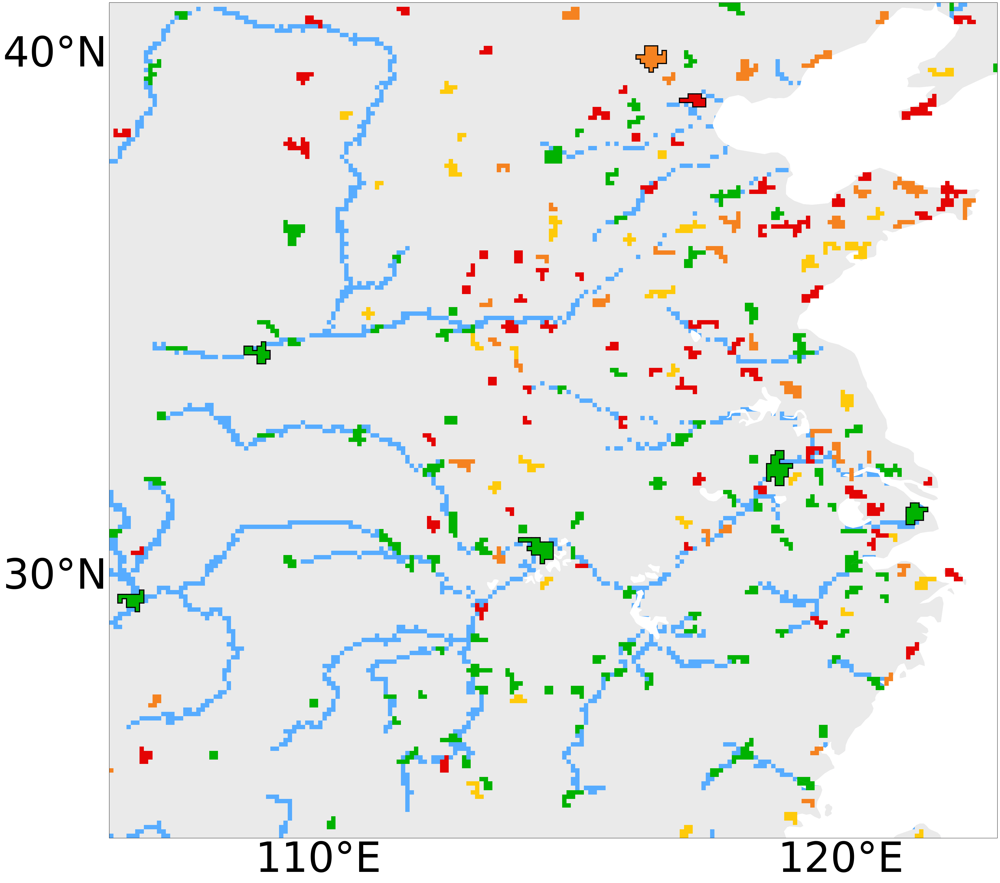

In [196]:
# paper review

import cartopy.crs as ccrs
import cartopy.feature as cfeature
import numpy as np
import os
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib.ticker as mticker

#各都市が利用する主河道のみを記述する方法

def geography(left, right, bottom, top):
    #
    resolution = 12
    #
    upperindex = (90-top)*resolution
    lowerindex = (90-bottom)*resolution
    leftindex = (180+left)*resolution
    rightindex = (180+right)*resolution
    #
    rgnshape = (lowerindex-upperindex, rightindex-leftindex)
    #
    img_extent = (left, right, bottom, top)
    
    return upperindex, lowerindex, leftindex, rightindex, rgnshape, img_extent

def draw_mask_sotowaku_outer(extent, mask_cropped, ax=None, sotowaku_color='#dc143c', linewidth=5, padding=0.1, pop_thres=5e6):
    """
    zorder = 0: デフォルトの最背面(gridをzorder=0に設定)
    zorder = 1: 赤色の外枠(citymask)
    
    extent: (x_left, x_right, y_bottom, y_top)
    mask_cropped: マスクされた都市域の2D配列
    ax: プロットする軸
    sotowaku_color: 枠線の色
    linewidth: 枠線の太さ
    padding: 枠線を外側にシフトさせる量（度単位）
    """
    mask_cropped = np.ma.filled(mask_cropped, 0)

    # delta
    delta = 360/4320
    x_left = extent[0]
    y_top = extent[3]
    
    # outer
    upper_indices = []
    lower_indices = []
    left_indices = []
    right_indices = []
    rows, cols = mask_cropped.shape
    for i in range(rows-1):
        for j in range(cols-1):
            if mask_cropped[i, j] > pop_thres and mask_cropped[i, j] != 0:
                if i > 0 and mask_cropped[i-1, j] == 0:
                    upper_indices.append((i, j))
                if i < rows-1 and mask_cropped[i+1, j] == 0:
                    lower_indices.append((i, j))
                if j > 0 and mask_cropped[i, j-1] == 0:
                    left_indices.append((i, j))
                if j < cols-1 and mask_cropped[i, j+1] == 0:
                    right_indices.append((i, j))

    # extent
    projection = ccrs.PlateCarree()

    # city mask
    for up in upper_indices:
        x_index = x_left + delta*(up[1])
        y_index = y_top - delta*(up[0]) + padding * delta
        ax.plot([x_index, x_index+delta], [y_index, y_index], color=sotowaku_color, transform=projection, linewidth=linewidth, zorder=1) # top
    for lo in lower_indices:
        x_index = x_left + delta*(lo[1])
        y_index = y_top - delta*(lo[0]+1) - padding * delta
        ax.plot([x_index, x_index+delta], [y_index, y_index], color=sotowaku_color, transform=projection, linewidth=linewidth, zorder=1) # bottom
    for le in left_indices:
        x_index = x_left + delta*(le[1]) - padding * delta
        y_index = y_top - delta*(le[0]+1)
        ax.plot([x_index, x_index], [y_index, y_index+delta], color=sotowaku_color, transform=projection, linewidth=linewidth, zorder=1) # left
    for ri in right_indices:
        x_index = x_left + delta*(ri[1]+1) + padding * delta
        y_index = y_top - delta*(ri[0]+1)
        ax.plot([x_index, x_index], [y_index, y_index+delta], color=sotowaku_color, transform=projection, linewidth=linewidth, zorder=1) # right

    return ax

def east_asia_plot(left, right, bottom, top, linewidth=5, padding=0.1):
    # init 
    pop_thres=5e6
    threshold = 5*1e6*1000

    # path
    h08dir = '/mnt/c/Users/tsimk/Downloads/dotfiles/h08'
    upperindex, lowerindex, leftindex, rightindex, rgnshape, img_extent = geography(left, right, bottom, top)
    
    # wsi/pre/population_m3year.ipynb
    population_path = f'{h08dir}/wsi/dat/population/population_threshold_world.npy'
    population = np.load(population_path)
    population_cropped = population[upperindex:lowerindex, leftindex:rightindex]
    
    # wsi/pre/availability_m3year.ipynb
    availability_path = f'{h08dir}/wsi/dat/availablewater/availablewater_threshold_world.npy'
    availability = np.load(availability_path)
    availability_cropped = availability[upperindex:lowerindex, leftindex:rightindex]

    # wsi/pst/MPCY_background.ipynb
    riv_path_array_path = f'{h08dir}/wsi/dat/riv_path/riv_path_array.gl5'
    riv_path_array = np.fromfile(riv_path_array_path, dtype='float32').reshape(2160, 4320)
    
    # wsi/pre/MPCY_citylonlat_citygrid.ipynb
    grid_path = f'{h08dir}/wsi/dat/cmy/world_citygrid.npy'
    citygrid = np.load(grid_path)
    citygrid_masked = np.ma.masked_where(citygrid==0, citygrid)
    region = citygrid_masked[upperindex:lowerindex, leftindex:rightindex]
    region_masked = np.ma.masked_where(region==0, region)

    # discharge
    riv_path = f'{h08dir}/wsi/dat/riv_out_/W5E5LR__00000000.gl5'
    rivout = np.fromfile(riv_path, dtype='float32').reshape(2160, 4320)
    rivout_tmp = np.ma.masked_where(riv_path_array==0, rivout)
    rivout_cropped = rivout_tmp[upperindex:lowerindex, leftindex:rightindex] * 60 * 60 * 24 * 365 / 1000
    rivout_masked = np.ma.masked_where(rivout_cropped==0, rivout_cropped)
    rivout_thres = np.ma.masked_where(rivout_masked<threshold, rivout_masked)
    
    bounds = [0, 100, 300, 1000, 1700]
    cmap = mcolors.ListedColormap(['#e40404', '#f58220', '#feca0a', '#00b200'])
    norm = mcolors.BoundaryNorm(bounds, cmap.N)
    
    plt.rcParams["font.size"] = 50
    projection = ccrs.PlateCarree()
    fig, ax = plt.subplots(figsize=(50,40), subplot_kw={'projection': projection})

    river_cmap = mcolors.ListedColormap(['#57acff'])
    imr = ax.imshow(rivout_thres, 
                    extent=img_extent,
                    cmap=river_cmap,
                    transform=projection,
                    zorder=-2
                   )
    
    imd = ax.imshow(region_masked, 
                  cmap= cmap,
                  norm = norm,
                  extent=img_extent,
                  transform=projection, 
                 )
    
    ax.add_feature(cfeature.LAND, edgecolor='none', facecolor='#eaeaea', zorder=-3)
    ax.add_feature(cfeature.OCEAN, edgecolor='none', facecolor='#ffffff')
    ax.add_feature(cfeature.LAKES, edgecolor='none', facecolor='#ffffff', zorder=-1)
    ax.add_feature(cfeature.COASTLINE, linewidth=0.1,edgecolor='#d0cfd4')
    ax.add_feature(cfeature.BORDERS, linestyle='-', linewidth=1.5, edgecolor='#d0cfd4', zorder=-3)
    
    gl = ax.gridlines(draw_labels=True, zorder=2, color='gray', alpha=0.5, linestyle='--')
    gl.xlocator = mticker.FixedLocator(np.arange(round(left/10)*10, right, 10))
    gl.ylocator = mticker.FixedLocator(np.arange(round(bottom/10)*10, top, 10))
    gl.top_labels = False
    gl.right_labels = False
    gl.bottom_labels = True
    gl.left_labels = True
    gl.xlines = False
    gl.ylines = False
    gl.xlabel_style = {'size': 110, 'color': 'black'}
    gl.ylabel_style = {'size': 110, 'color': 'black'}
    
    ax.gridlines(visible=False)
    ax.spines['geo'].set_visible(True)
    
    #cbar = fig.colorbar(imd, ax=ax, orientation='horizontal', pad=0.02)
    draw_mask_sotowaku_outer(img_extent, population_cropped, ax=ax, sotowaku_color='black', linewidth=linewidth, padding=padding, pop_thres=pop_thres)
    plt.show()

linewidth = 3
padding = 0.0
east_asia_plot(106, 123, 25, 41, linewidth=linewidth, padding=padding)

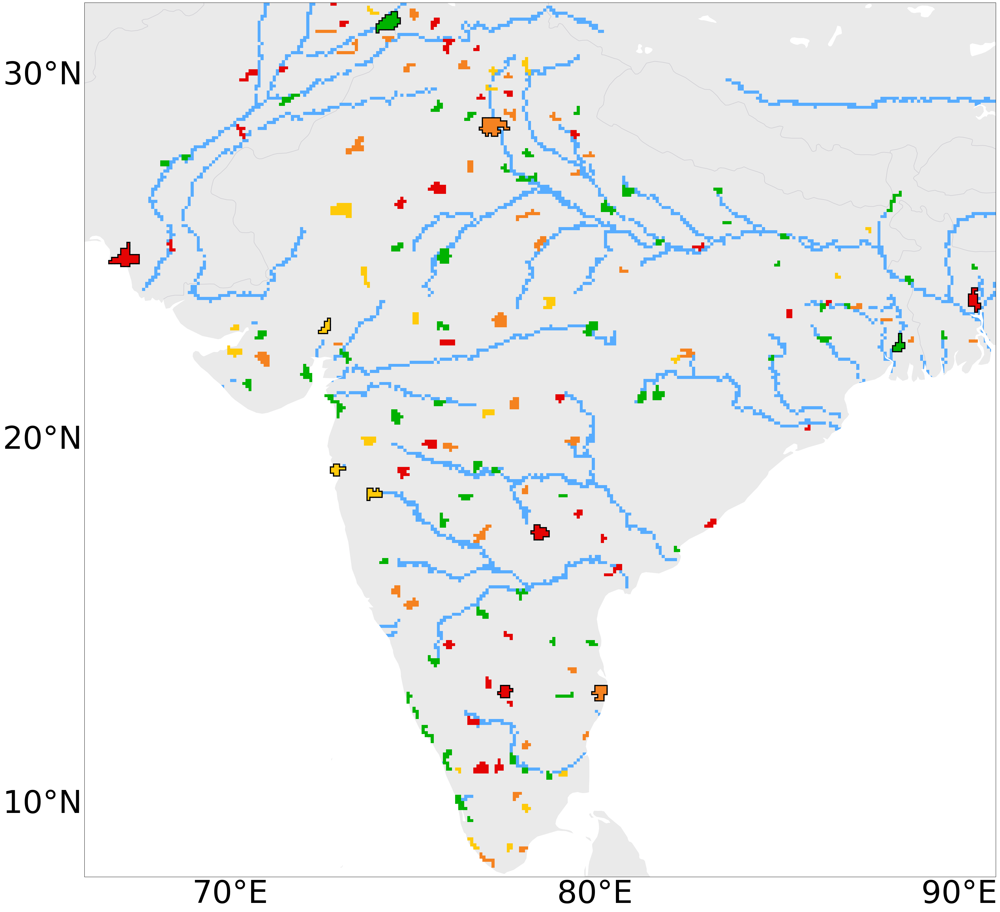

In [195]:
paper_plot(66, 91, 8, 32, linewidth=linewidth, padding=padding)

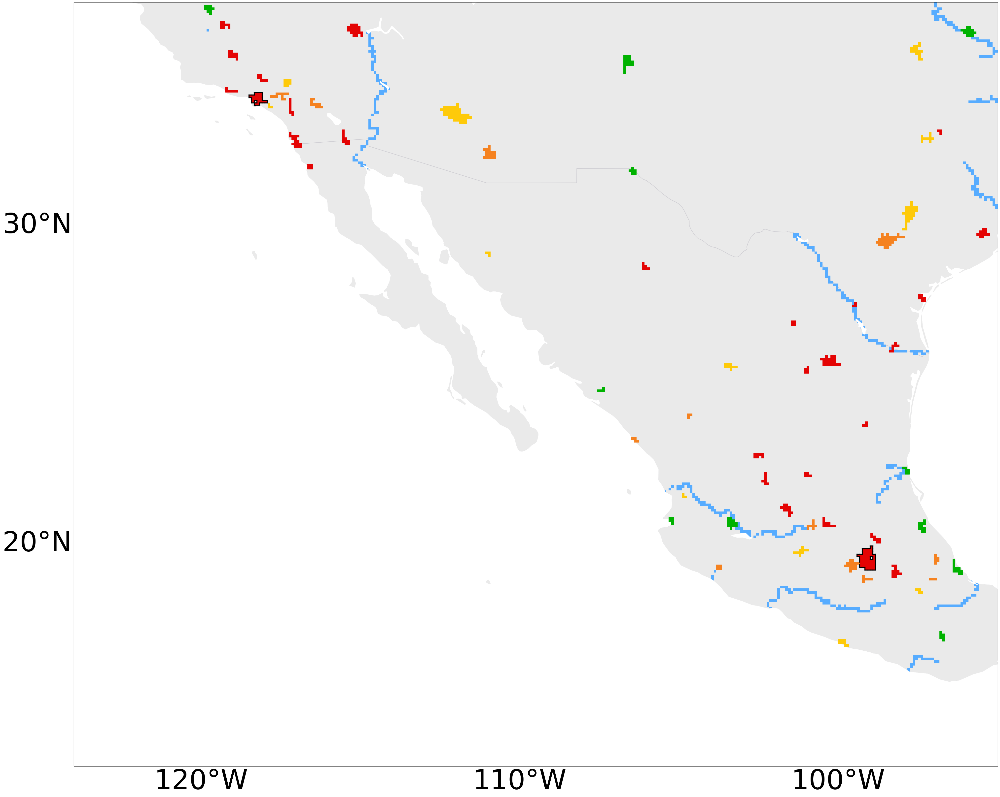

In [204]:
paper_plot(-124, -95, 13, 37, linewidth=linewidth, padding=padding)

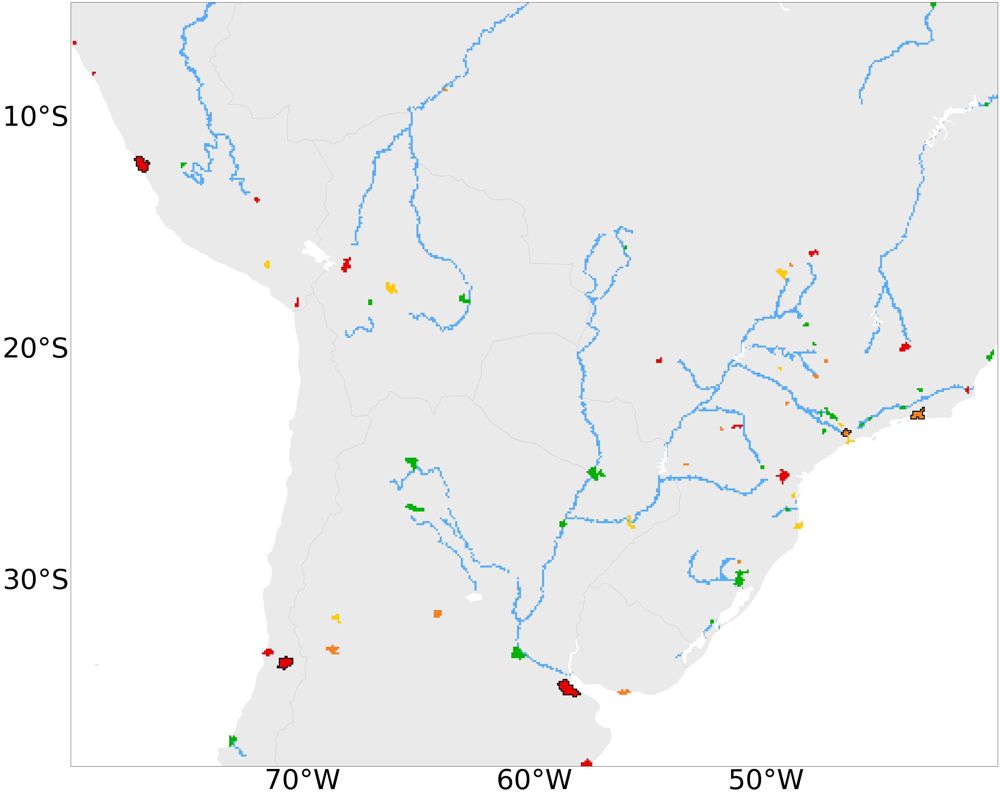

In [209]:
paper_plot(-80, -40, -38, -10, linewidth=linewidth, padding=padding)

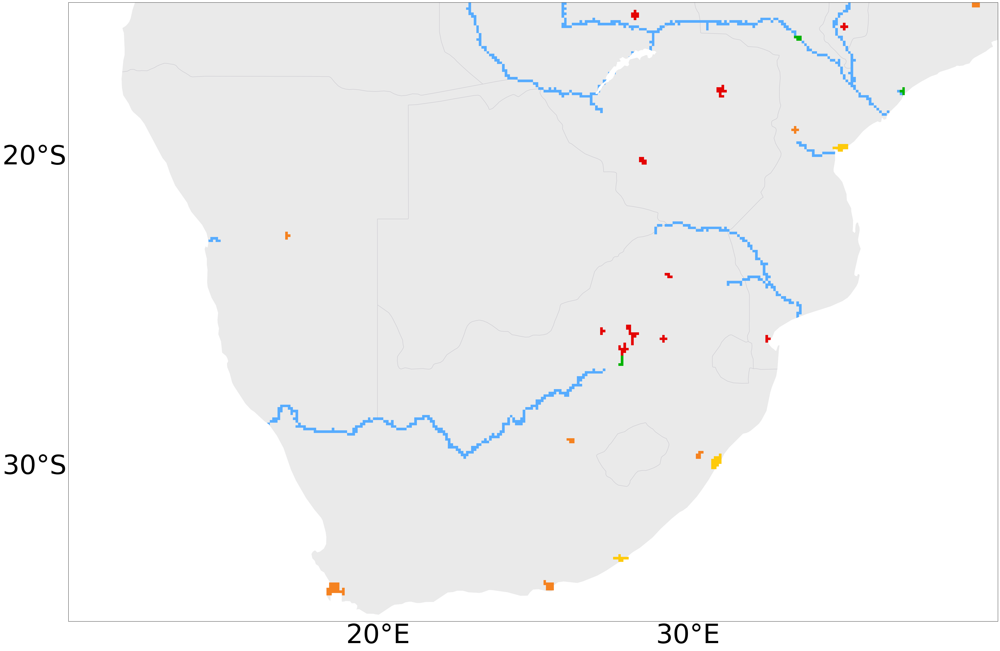

In [210]:
paper_plot(10, 40, -35, -15, linewidth=linewidth, padding=padding)